* This is the attenuation for 60 lines laterally and 15 mm axially. It depends on the threshold. So I should change the threshold to get maximum separation. The problem is if I change the threshold to get a good BSC separation then the ATT won't be good. 

* If I change the threshold to get good ATT, then the BSC won't be good. 

* But the threshold has to be around 9% +- 3% 

* The BSC is very robust once the ATT is fixed, somewhat. It is less variant than the ATT

* It doesn't matter if I change the size of the ROI window of the ATT, the result doesn't seem like it improves at alll. So it makes sense to look at the attenuation result first before looking at the BSC. 

* There is a deeper issue here, I don't think that I can fix it. The more I fix it, the worse it get. 

The problem is the fix does not have a physical based values. 


In [1]:
import h5py
import os
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob, os
from sklearn.utils import shuffle

# Machine learning
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import scale
from scipy.stats import ttest_ind

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

/Users/trongnguyen/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
sns.set_context("poster", rc={"font.size":20,"axes.titlesize":20,"axes.labelsize":20}) 
import matplotlib 
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16) 
sns.set_style('darkgrid')

In [4]:
os.chdir('/Users/trongnguyen/Dropbox/FattyLiver/src/hydrogen/')
from helper_brl.visualizeHelper import extract_segment_points, envDetection, filter_frame
from helper_brl import fattyLiver
from helper_brl.fattyLiver import get_training_data, get_testing_data, choose_testing_rabbits_indices
from helper_brl.outlierDetection import getBSC_Att, getBSC_Att_old, filter_bsc, \
filter_BSC_based_on_depth, findOutliers, filter_ATT_curve
from helper_brl import frequencyAnalysis
from helper_brl.formFactor import get_ESD_EAC, gaussian_form_factor_bsc, exponential_form_factor_bsc

In [30]:
%qtconsole

# Load Data

In [5]:
newdataBase = pd.read_excel('/Users/trongnguyen/Dropbox/FattyLiver/Rabbit_Liver_40.xlsx', sheet_name=0)
aliveOnly = newdataBase[newdataBase['Timely death'] == 1]
dataBase = aliveOnly[['Rabbit', 'Injection level', 'Weeks on diet','Lipid']]
dataBase = dataBase[dataBase['Injection level'] ==0]

threshold_lipid = 9
dataBase['High'] = dataBase.Lipid > threshold_lipid
dataBase = dataBase.sort_values(['Lipid'])
dataBase.index = range(1, 16)
dataBase['Labels'] = dataBase['High'].apply(lambda x: 'High lipid' if x else 'Low lipid')

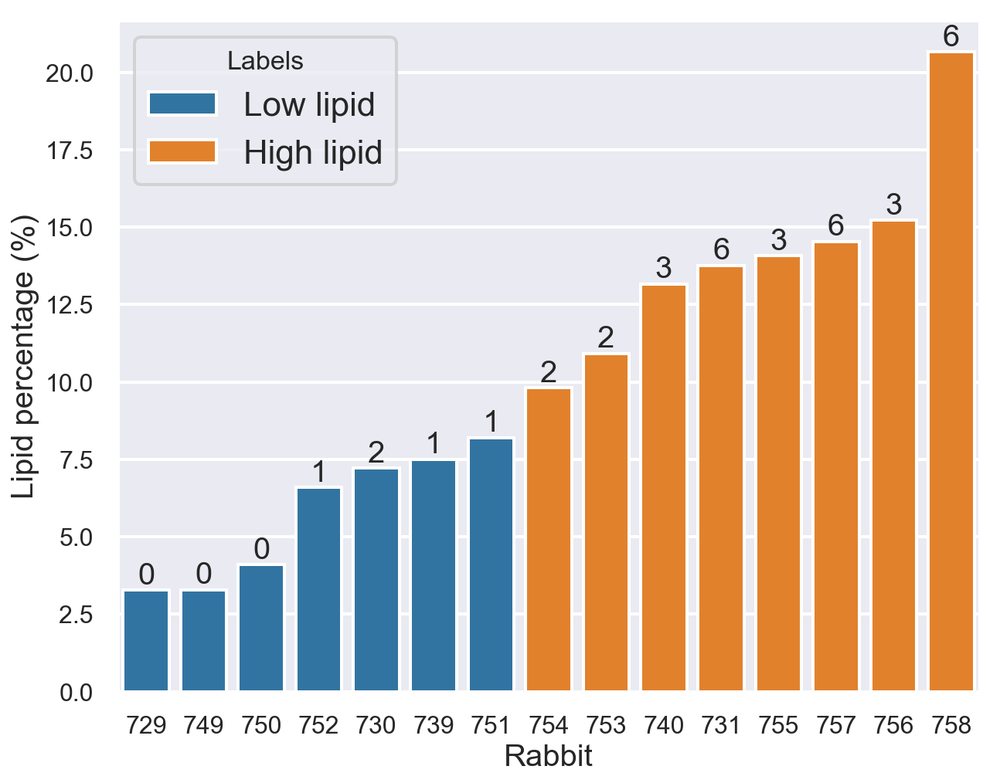

In [6]:
plt.figure(figsize = (10, 8))
ax = sns.barplot(x = 'Rabbit', y = 'Lipid', data = dataBase, hue = 'Labels', \
            order=dataBase.Rabbit, dodge = False)

ax.set_ylabel('Lipid percentage (%)')
count = 1
for p in ax.patches:
    height = p.get_height()
    if np.isnan(height):
        continue
    no_weeks = dataBase['Weeks on diet'][count]
    count = count + 1
    plt.text(p.get_x()+p.get_width()/2.,
            height + 0.2,
            no_weeks,
            ha="center") 

## Load BSC and ATT

In [7]:
RIGHT_SIDE = ['754', '751', '729']

In [8]:
#RIGHT_SIDE = ['750', '754', '753']
#RIGHT_SIDE = ['730', '751', '750']
# RIGHT_SIDE = ['730', '750', '754', '753', '751', '731']
#RIGHT_SIDE = ['730', '750', '754', '753', '751', '731']

In [9]:
ATTs_dict, freq_att_dict, freq_bsc_dict, depth_dict, BSCs_dict = {}, {}, {}, {}, {} 
left_dict, right_dict, top_dict, bottom_dict = {}, {}, {}, {} # ROIs of each BSC
att_bottom, bad_BSC = {}, {}

#name_tag = 'fix_bug_average_ref_phantom_6MHz_v7_10a_30b'
#name_tag = 'fix_bug_average_ref_phantom_6MHz_v7_15a_30b'
#name_tag = 'fix_bug_average_ref_phantom_3_6MHz_v8_12a40_30b'
#fix_bug_average_ref_phantom_3_6MHz_v8_10a40_30b
name_tag = 'fix_bug_average_ref_phantom_3_6MHz_v8_10a40_30b'
for idx, row in dataBase.iterrows():
    number = str(int(row.Rabbit))
    print(number, end = ', ')
    if number in RIGHT_SIDE:
        path = "/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L" + number + "/L94_right/BSC_ATT/"
    else:
        path = "/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L" + number + "/L94_left/BSC_ATT/"
    ATTs_dict[number], freq_att_dict[number], BSCs_dict[number], freq_bsc_dict[number], \
    depth_dict[number], left_dict[number], right_dict[number], \
    top_dict[number], bottom_dict[number], att_bottom[number], bad_BSC[number] = getBSC_Att(path,name_tag)

729, 749, 750, 752, 730, 739, 751, 754, 753, 740, 731, 755, 757, 756, 758, 

In [10]:
rf_hdf5_path = '/Volumes/TrongDrive/Liver_Study/RF_hdf5/'
root_path = '/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L'

# Attenuation 

Initialization 

In [11]:
dataBase['att slope'] = 0
dataBase['att intercept'] = 0
dataBase['midband fit'] = 0
dataBase['bad Rabbit'] = False

In [12]:
#dataBase.loc[dataBase.Rabbit == 751, 'bad Rabbit'] = True
dataBase.loc[dataBase.Rabbit == 729, 'bad Rabbit'] = True

In [13]:
threshold_lipid = 9
dataBase['High'] = dataBase.Lipid >= threshold_lipid

Plot and filter

Threshold lipid 9.000000


(0, 10)

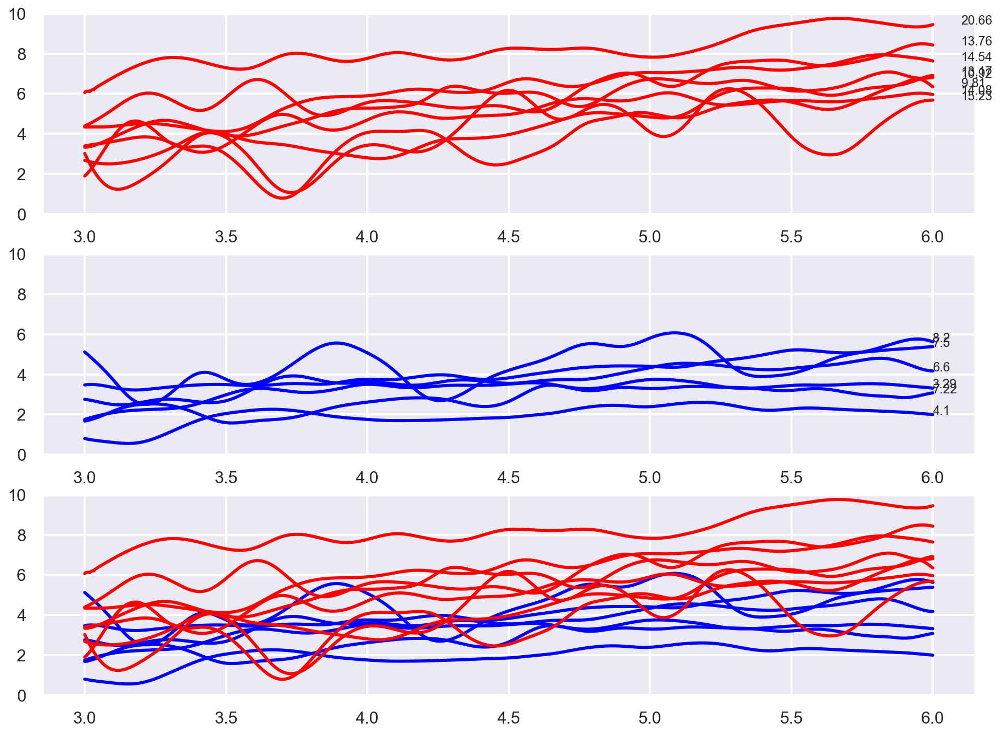

In [14]:
f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (16, 12))
mean_att_red  = []
mean_att_blue = []
slope_intercept_att = np.zeros((15, 2))
print("Threshold lipid %f" % threshold_lipid )
for idx, row in dataBase.iterrows():
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    if row['bad Rabbit']:
        continue
    atts = ATTs_dict[rabbit_number]
    if (len(atts) == 0):
        continue 
        print(rabbit_number)
    freq_key = next(iter(freq_att_dict[rabbit_number]))
    freq = freq_att_dict[rabbit_number][freq_key].flatten()
    
    rabbit_att = []
    for frame_ in atts:
        if (atts[frame_].shape[1] > 0):
            bottom_depth = att_bottom[rabbit_number][frame_].flatten()
            filter_att = []
            for idx in range(bottom_depth.shape[0]): # goes through all the ROIs
                if ((bottom_depth[idx] < 37) and (bottom_depth[idx] >5)):
                    single_att = atts[frame_][:,idx]
                    filter_att.append(single_att)
            if not filter_att:
                continue
            avg_att = np.mean(np.vstack(filter_att), axis = 0)
            rabbit_att.append(avg_att) #mean att in each frame

    #rabbit_att  = filter_ATT_curve(freq, np.vstack(rabbit_att))  
    if not rabbit_att:
        print(rabbit_number)
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'bad Rabbit'] = True
        continue
    rabbit_att  = np.mean(np.vstack(rabbit_att), axis = 0) #mean att for each rabbit
    idx = (freq >=4.0) & (freq <=5.0)
    if (lipid > threshold_lipid):
        ax1.plot(freq, rabbit_att, color = 'red') 
        ax3.plot(freq, rabbit_att, color = 'red') 
        
        slope, intercept = np.polyfit(freq, rabbit_att, 1)
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'att slope'] = slope
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'att intercept'] = intercept
        dataBase.loc[dataBase.Rabbit == row.Rabbit, 'midband fit'] = rabbit_att[idx].mean()
        mean_att_red.append(rabbit_att)
        ax1.text(freq[-1] + 0.1, rabbit_att[-1], str(lipid), fontsize = 12)
    else:
        #continue
        ax2.plot(freq, rabbit_att, color = 'blue')
        ax3.plot(freq, rabbit_att, color = 'blue') 
        slope, intercept = np.polyfit(freq, rabbit_att, 1)
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'att slope'] = slope
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'att intercept'] = intercept
        dataBase.loc[dataBase.Rabbit == row.Rabbit, 'midband fit'] = rabbit_att[idx].mean()
        mean_att_blue.append(rabbit_att)
        slope, intercept = np.polyfit(freq, rabbit_att, 1)
        ax2.text(freq[-1] , rabbit_att[-1], str(lipid), fontsize = 12)

ax1.set_ylim([0, 10])
ax2.set_ylim([0, 10])
ax3.set_ylim([0, 10])
#plt.xlabel('Frequency (MHz)')
#plt.ylabel('dB/cm')
#plt.title('Attenuation for all of the rabbits')

In [15]:
dataBase_filter = dataBase[dataBase['bad Rabbit'] == False]

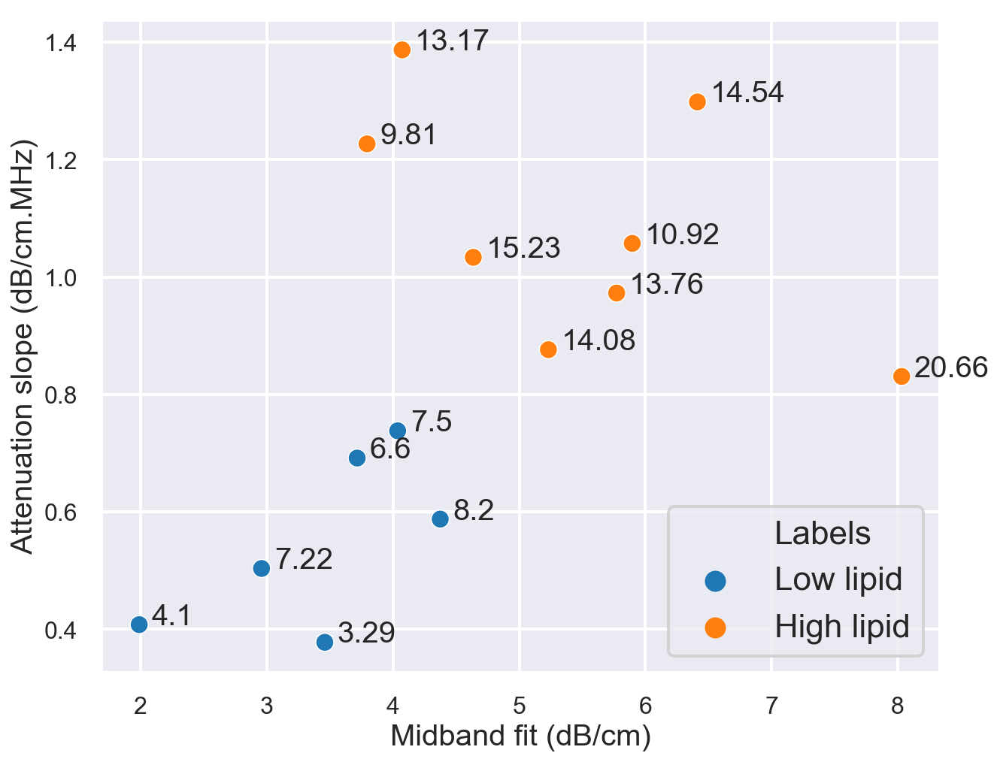

In [16]:
plt.figure(figsize = (10, 8))
ax = sns.scatterplot(x = 'midband fit', y = 'att slope', data = dataBase_filter, hue = 'Labels')
ax.set_xlabel('Midband fit (dB/cm)')
ax.set_ylabel('Attenuation slope (dB/cm.MHz)')
for idx, row in dataBase_filter.iterrows():
    ax.text(dataBase_filter['midband fit'][idx]+ 0.1, dataBase_filter['att slope'][idx],\
            dataBase_filter['Lipid'][idx])
plt.legend(loc='lower right')

In [ ]:
plt.figure(figsize = (10, 8))
g = sns.barplot(x = 'Lipid', y = 'att slope', data = dataBase_filter, \
                dodge = False, color = 'cornflowerblue')
#g.set_xticklabels(g.get_xticklabels(), rotation=45)
plt.xticks(rotation=40)

In [ ]:
plt.figure(figsize = (10, 8))
sns.barplot(x = 'Lipid', y = 'midband fit', data = dataBase_filter, dodge = False, color = 'cornflowerblue')

In [17]:
ttest_ind(dataBase_filter['att slope'][dataBase_filter.High == False],dataBase_filter['att slope'][dataBase_filter.High == True])

Ttest_indResult(statistic=-5.487971597473823, pvalue=0.00013891285920990037)

In [18]:
ttest_ind(dataBase_filter['att intercept'][dataBase_filter.High == False],dataBase_filter['att intercept'][dataBase_filter.High == True])

Ttest_indResult(statistic=0.3798432460406861, pvalue=0.7106989162890449)

In [19]:
ttest_ind(dataBase_filter['midband fit'][dataBase_filter.High == False],dataBase_filter['midband fit'][dataBase_filter.High == True])

Ttest_indResult(statistic=-3.214344185955161, pvalue=0.007432060823999218)

In [20]:
dataBase_filter['att slope'].groupby(dataBase_filter['High']).describe()

,count,mean,std,min,25%,50%,75%,max
High,,,,,,,,
False,6.0,0.551130,0.147545,0.377821,0.431843,0.545633,0.665668,0.738102
True,8.0,1.085365,0.200370,0.830714,0.948645,1.045491,1.244756,1.386951


In [21]:
dataBase_filter['midband fit'].groupby(dataBase_filter['High']).describe()

,count,mean,std,min,25%,50%,75%,max
High,,,,,,,,
False,6.0,3.421687,0.853805,1.987537,3.082866,3.587313,3.956271,4.373984
True,8.0,5.480966,1.375376,3.793781,4.495238,5.502203,6.025248,8.032260


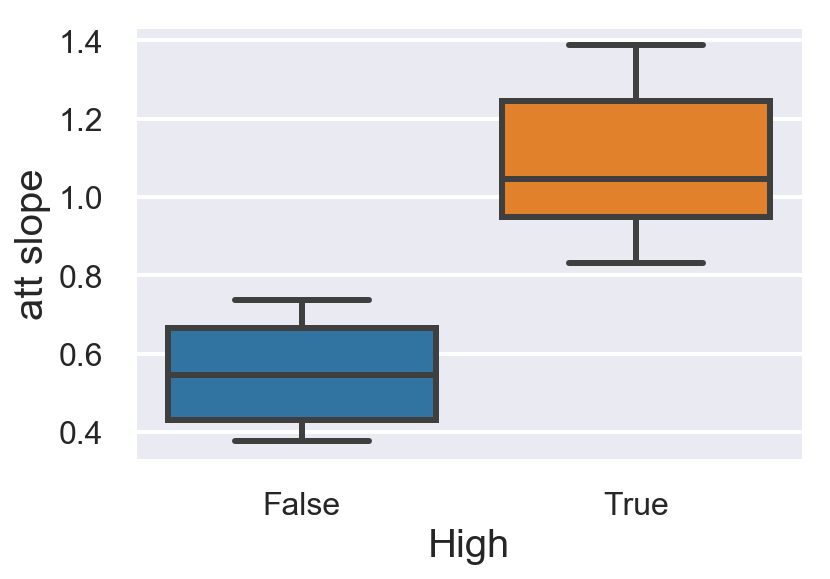

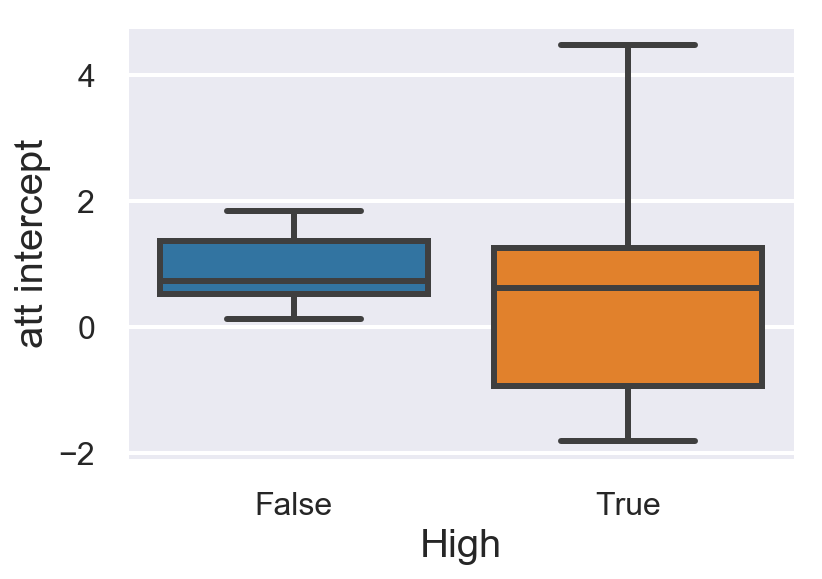

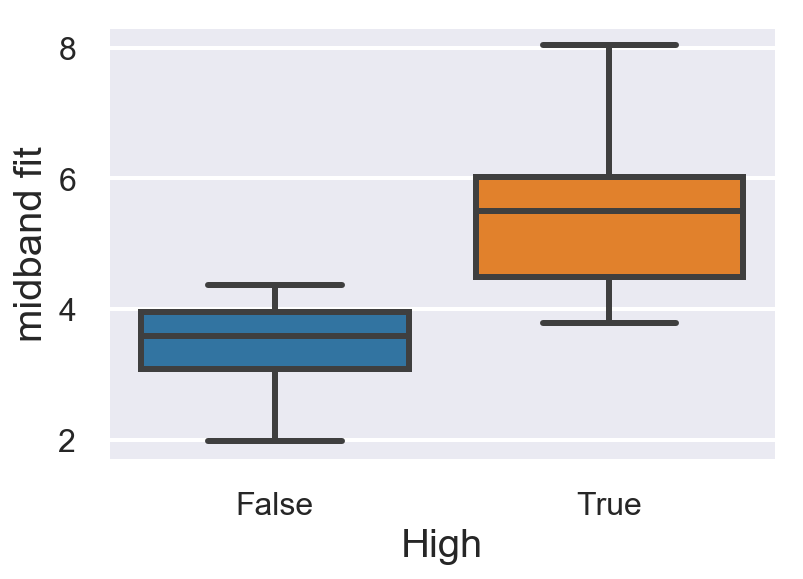

In [22]:
sns.boxplot(x = 'High', y = 'att slope', data = dataBase_filter)
plt.figure()
sns.boxplot(x = 'High', y = 'att intercept', data = dataBase_filter)
plt.figure()
sns.boxplot(x = 'High', y = 'midband fit', data = dataBase_filter)

## Attenuation for two classes

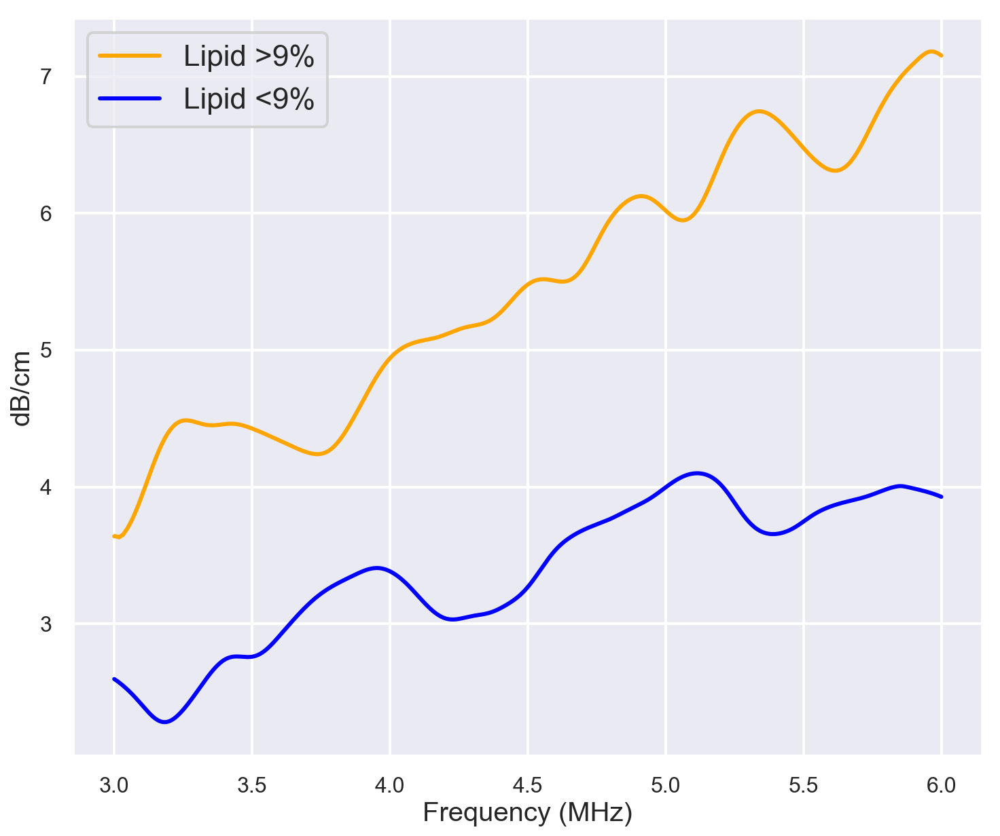

In [24]:
plt.figure(figsize = (12, 10))
high_fat_att = np.mean(np.vstack(mean_att_red), axis =0)
low_fat_att = np.mean(np.vstack(mean_att_blue), axis =0)
plt.plot(freq, high_fat_att, color = 'orange', label = 'Lipid >' + str(threshold_lipid)+ '%')
plt.plot(freq, low_fat_att, color = 'blue', label = 'Lipid <' + str(threshold_lipid)+ '%')
plt.xlabel('Frequency (MHz)')
plt.ylabel('dB/cm')
plt.legend()

In [25]:
slope1, intercept1 = np.polyfit(freq, high_fat_att, 1)

print(slope1, intercept1)
print(slope1 * 4.25 + intercept1)

slope2, intercept2 = np.polyfit(freq, low_fat_att, 1)

print(slope2, intercept2)
print(slope2 * 4.25 + intercept2)

1.08536515591607 0.5775113285165122
5.190313241159809
0.5511303027073526 0.9063297818490591
3.248633568355308


# BSC analysis

## Average BSC for all rabbits

exponential
163.58482860782613 24.944363371664156 246.4420540114642 32.218534021674415


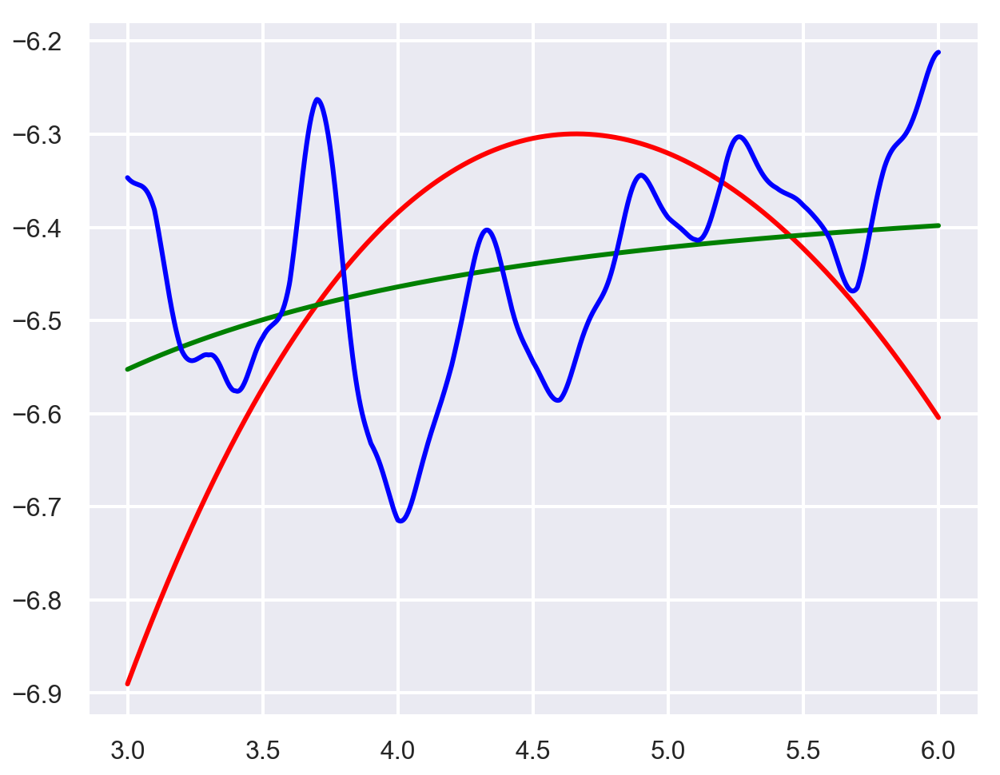

exponential
161.33466104794954 23.159195206119016 227.87161197536082 31.058201905041834


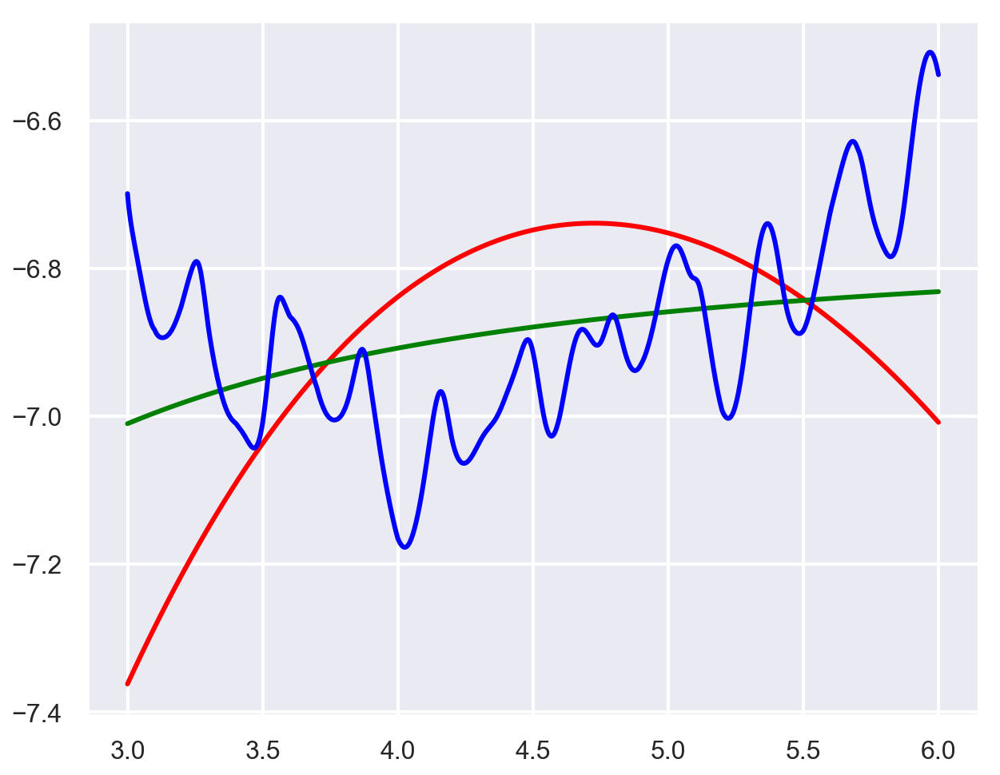

exponential
188.71841731452787 12.683281612542391 9008.08090659766 -10.81962256188832


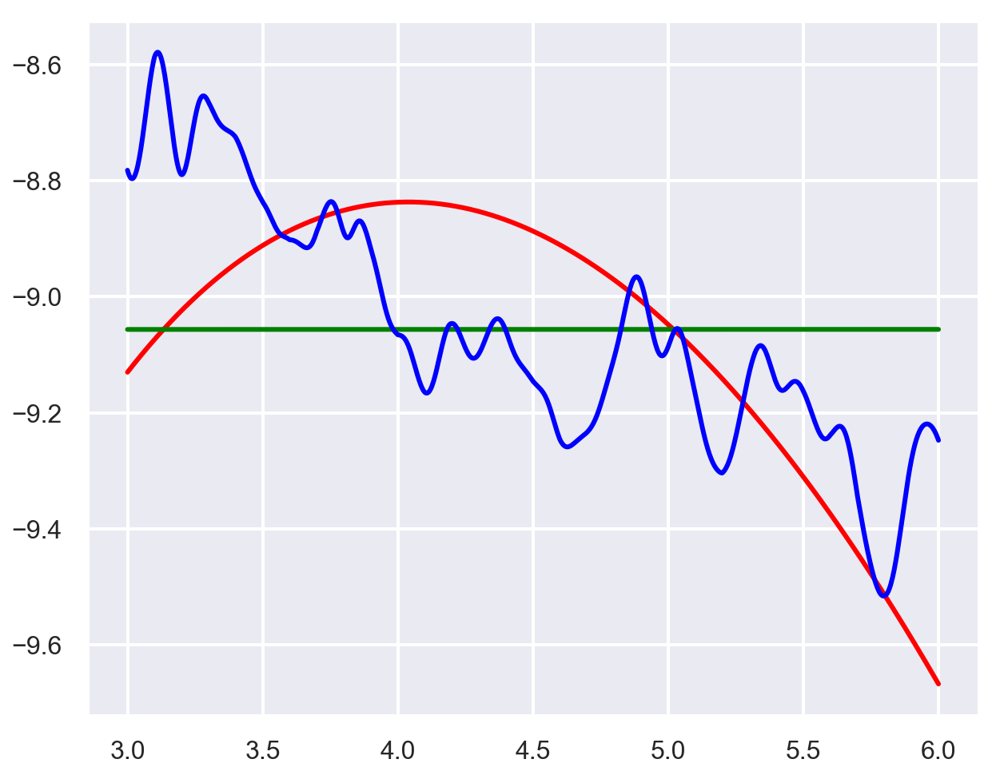

exponential
153.22216361204374 25.117159208141192 120.03946158665408 39.28659716331083


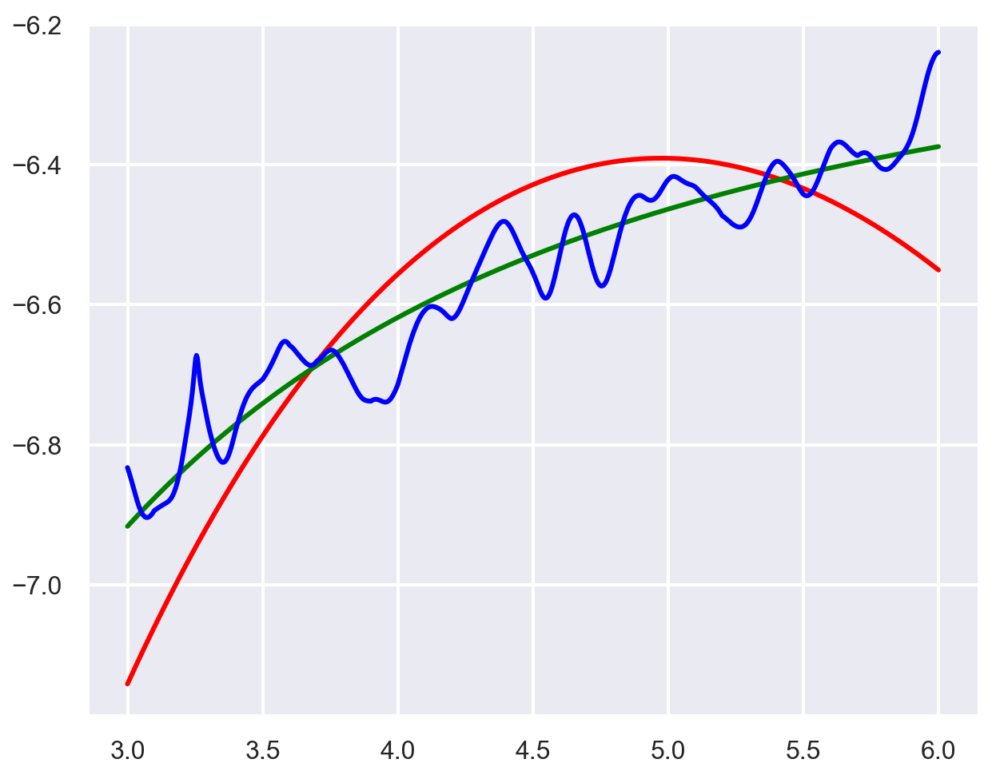

exponential
182.8102234221064 14.475621830307103 8056.673208527901 -8.196646672804901


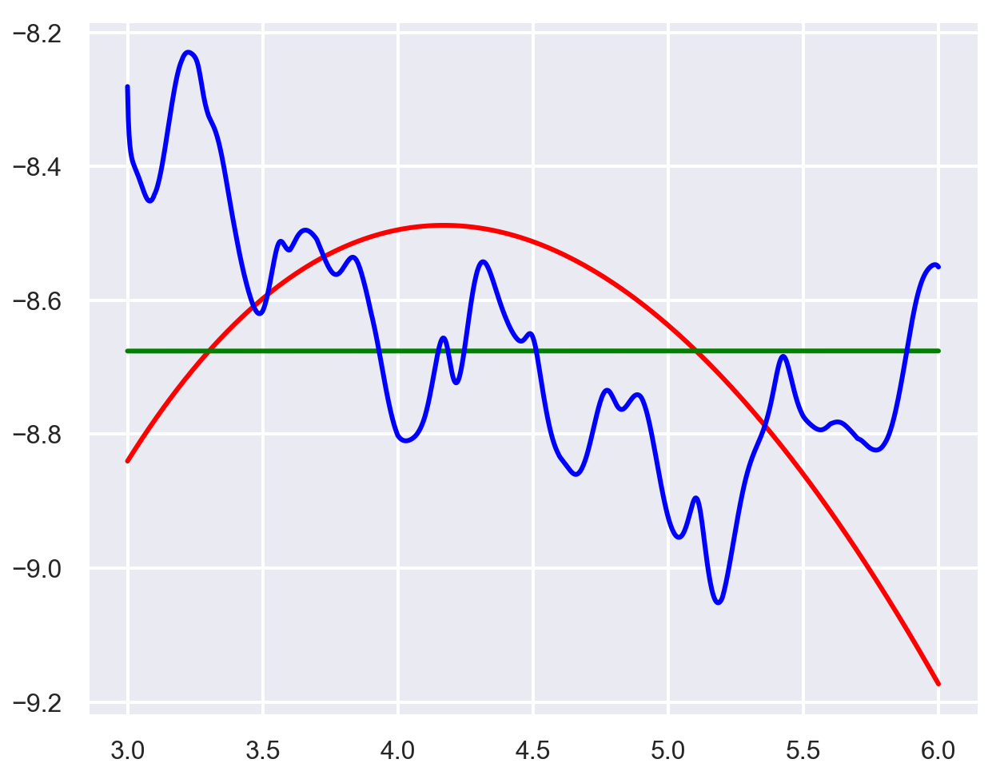

exponential
160.97420123431922 24.054674272338342 205.05866564304432 32.96922295454577


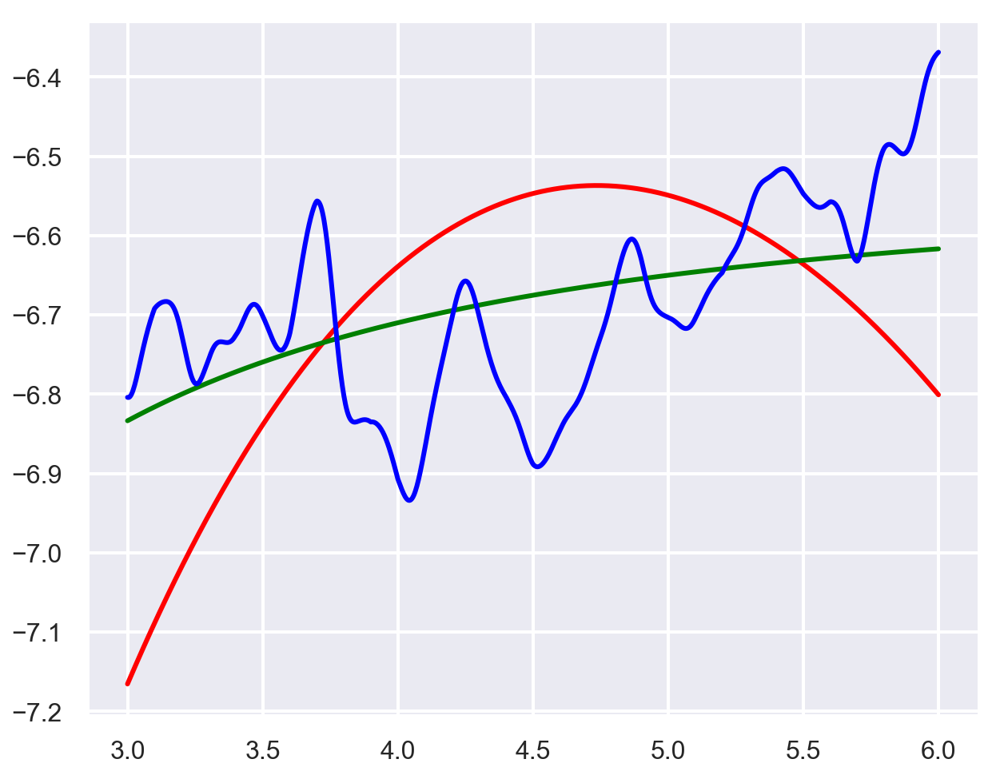

exponential
158.6279316628688 23.490062113126204 148.0235461034092 35.64799267447336


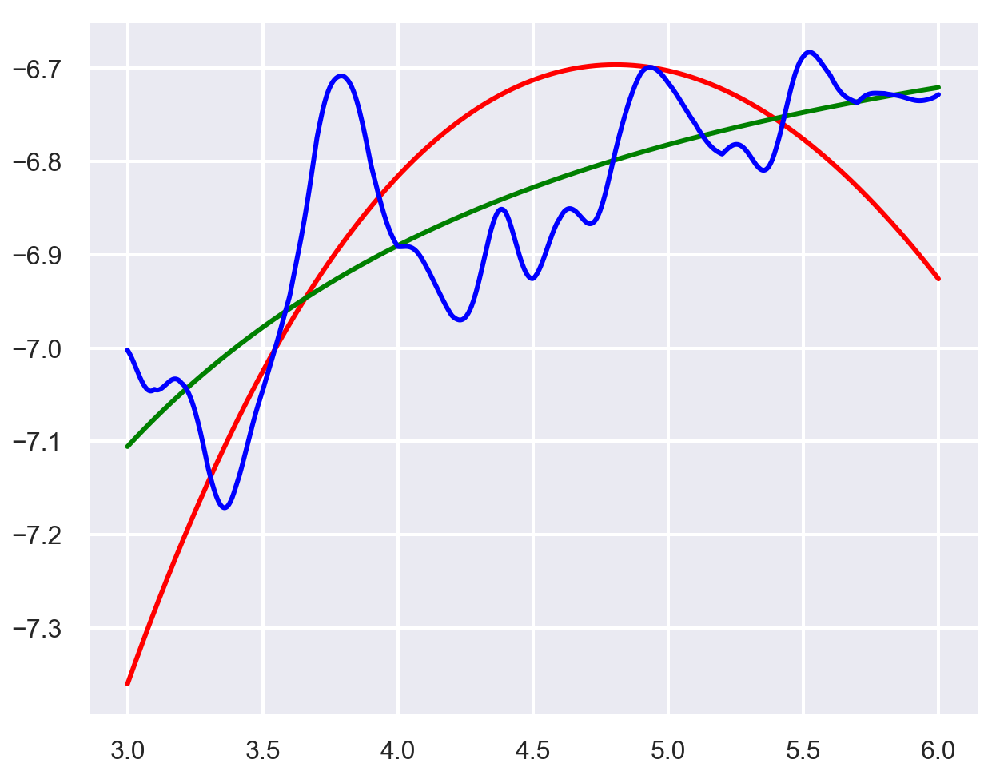

exponential
93.5790939888927 32.36099834981003 38.94070141280207 56.08101844694612


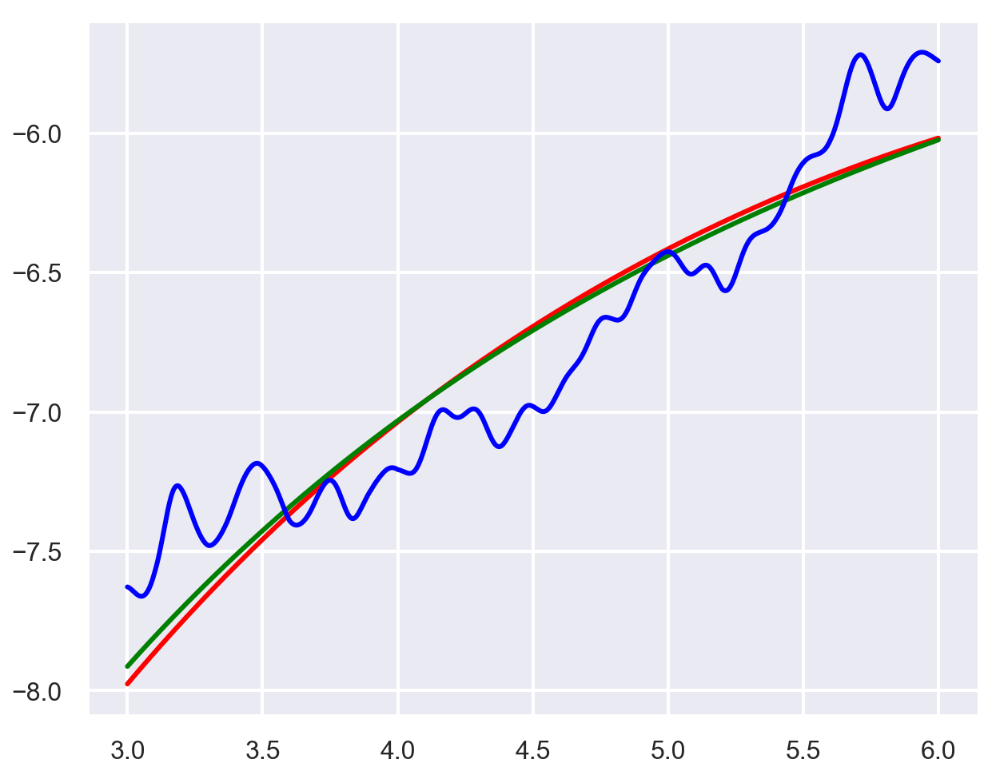

exponential
139.3128429180464 24.302239645439727 83.92814083098315 41.89033785666436


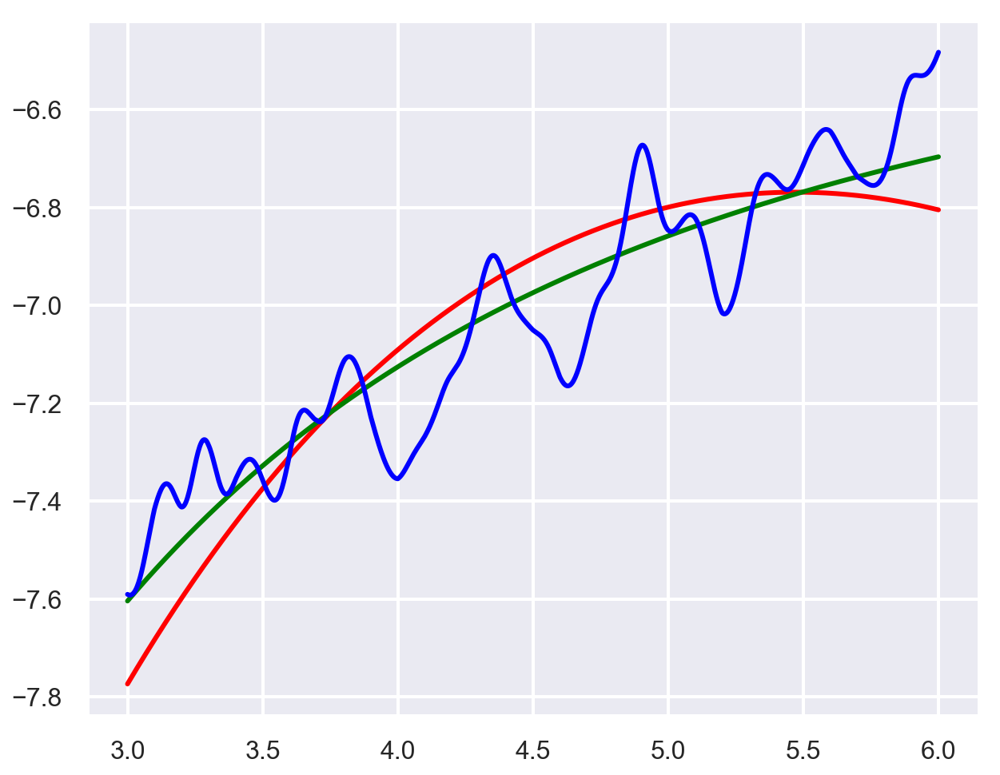

exponential
94.85860977628029 31.930915240021683 39.9382897916474 55.4198435992977


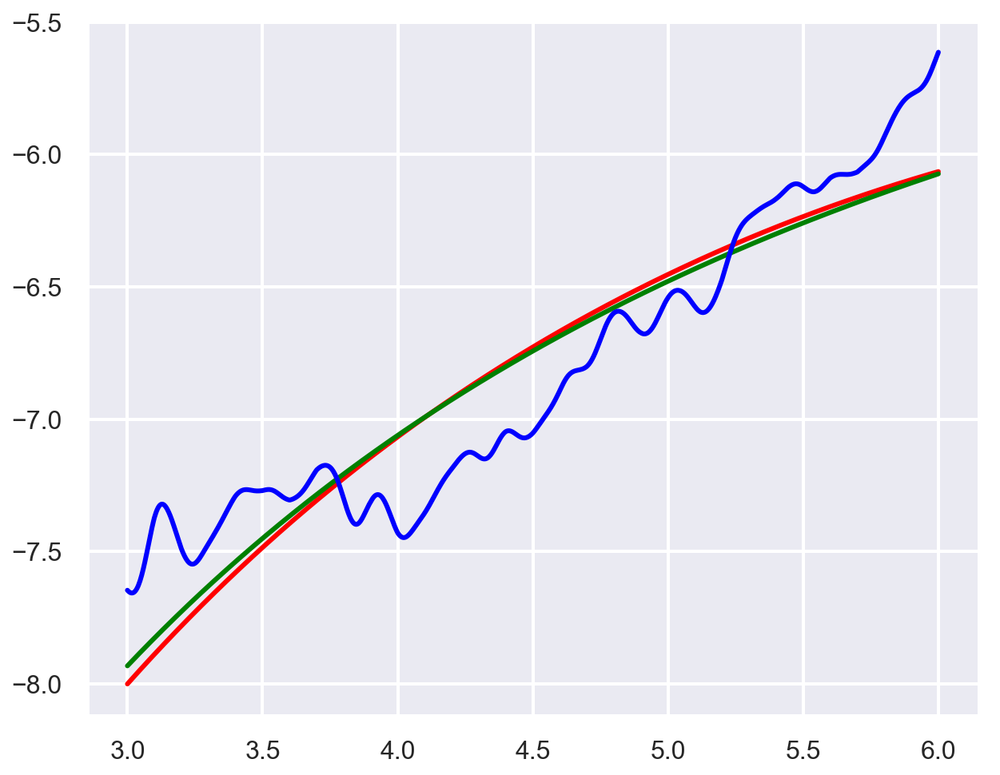

exponential
147.81293160784202 30.86351416907229 116.14603113051281 45.00185588670354


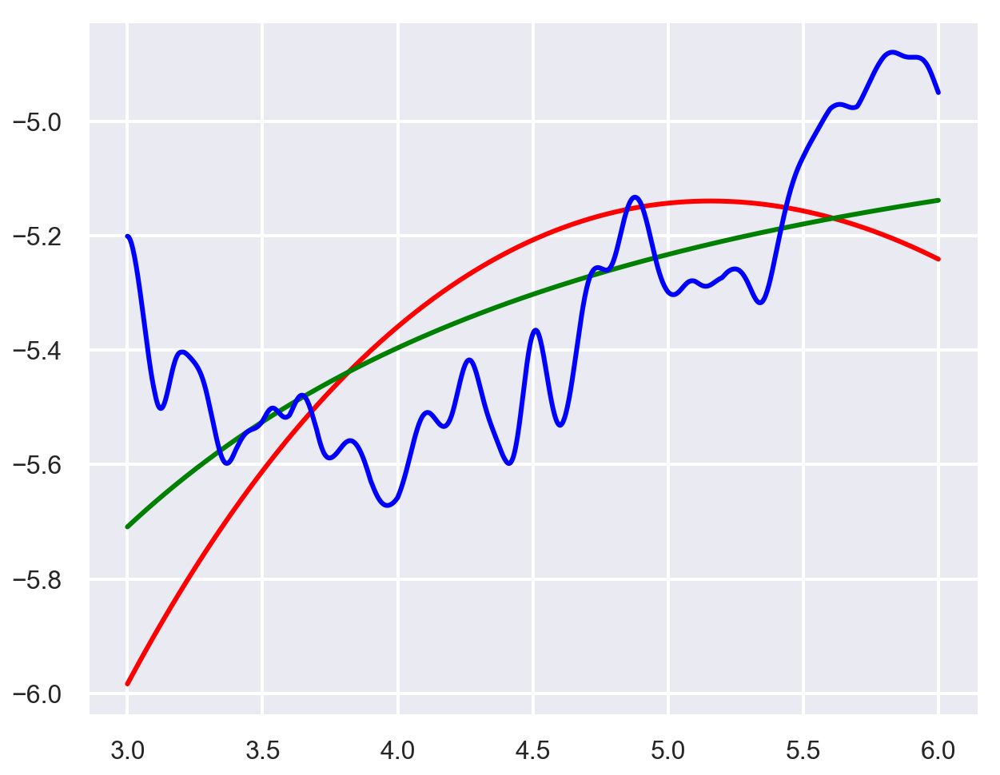

exponential
144.76349060654414 24.472783448640413 98.16125059561733 40.454001266657585


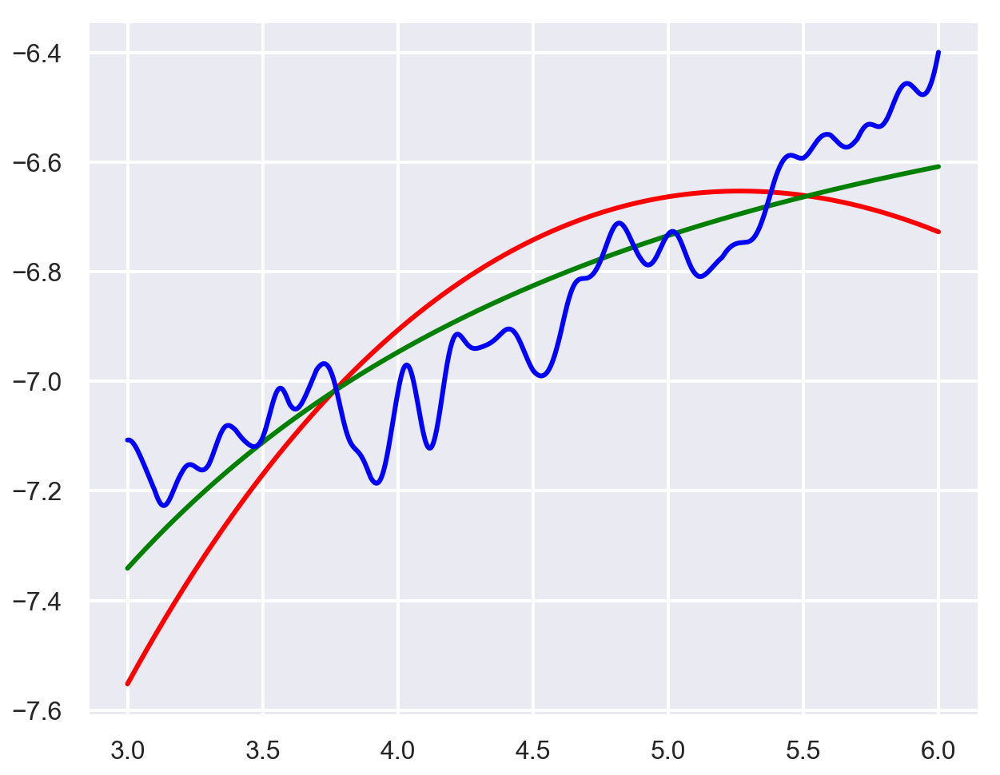

exponential
69.06564359376347 44.67846325832753 24.95078098416214 71.4029919159444


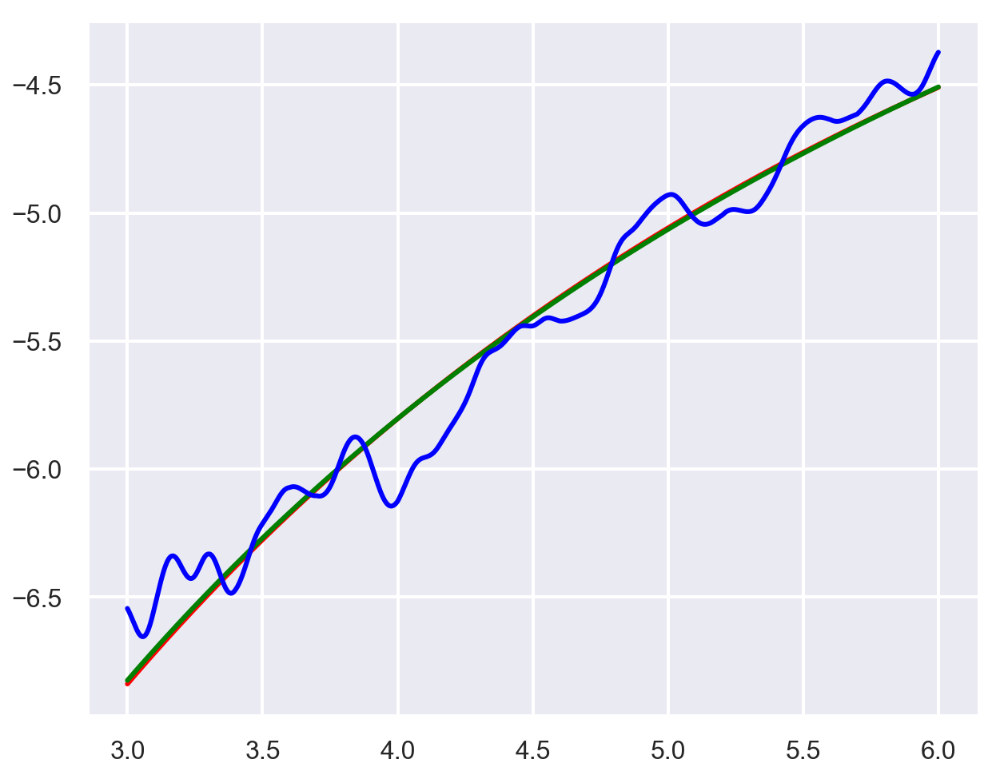

exponential
110.03449596079128 28.070935691859823 49.44140197246785 50.35325766640124


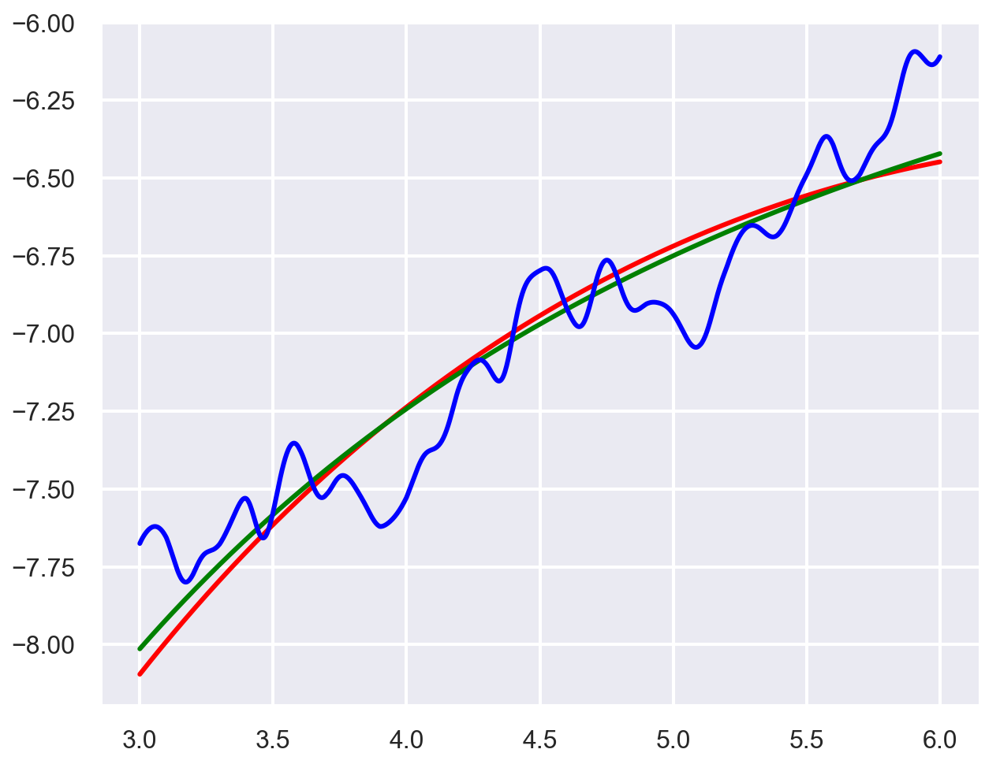

exponential
184.79949248514833 34.049584809827 137.92589412730558 50.380116280145735


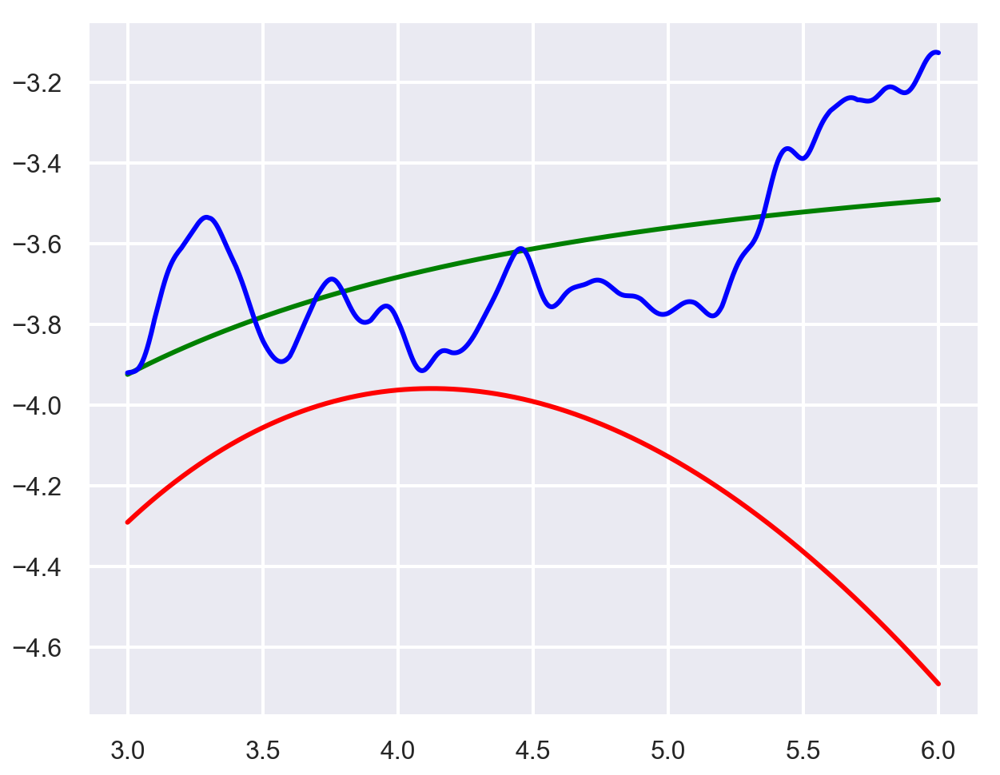

In [95]:
mean_red  = []
mean_blue = []


for idx, row in dataBase.iterrows():
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    bscs = BSCs_dict[rabbit_number]
    if (len(bscs) == 0):
        print(rabbit_number)
        continue
    freq_key = next(iter(freq_bsc_dict[rabbit_number]))
    freq = freq_bsc_dict[rabbit_number][freq_key].flatten()
    
    rabbit_bsc = []
    for frame_ in bscs:
        if (bscs[frame_].shape[1] > 0):
            bsc_filter, good_idxs = filter_bsc(bscs[frame_])
            if (len(bsc_filter)>0):
                avg_bsc = np.mean(bsc_filter, axis = 1)
                rabbit_bsc.append(avg_bsc)

    if (len(rabbit_bsc) ==0):
        continue
    rabbit_bsc  = np.mean(np.vstack(rabbit_bsc), axis = 0)
    if (np.isnan(rabbit_bsc).any()):                
        bsc_nan = rabbit_bsc
        print(bsc_nan)
        print(rabbit_number)
    plt.figure(figsize = (10, 8))
    if (lipid > threshold_lipid):
        #plt.plot(freq, np.log(rabbit_bsc), color = 'orange', linewidth = lipid /3.0) 
       
        if (not np.isnan(rabbit_bsc).any()):
            mean_red.append(rabbit_bsc)
            try:
                bsc_o = np.mean(np.vstack(rabbit_bsc), axis = 1)
                esd, eac = get_ESD_EAC(freq, bsc_o)
                bsc1 = gaussian_form_factor_bsc(esd*1e4, 10**(eac/10.0), freq)
                esd_ex, eac_ex = get_ESD_EAC(freq, bsc_o, type ='exponential')
                bsc2 = exponential_form_factor_bsc(esd_ex, 10**(eac_ex/10.0), freq)
                plt.plot(freq, (bsc1), 'r')
                plt.plot(freq, bsc2, 'g')
                plt.plot(freq, np.log(bsc_o),'b')
            except:
                esd = 0
                eac = 0
            print(esd*1e4, eac, esd_ex, eac_ex)
            #plt.text(freq[-1] + 0.01 , rabbit_bsc[-1], str(lipid), fontsize = 12)
            #plt.text(freq[0] - 0.01 , rabbit_bsc[0], rabbit_number, fontsize = 12)
    else:
        # plt.plot(freq, np.log(rabbit_bsc), color = 'blue', linewidth = lipid /3.0)
        if (not np.isnan(rabbit_bsc).any()):
            mean_blue.append(rabbit_bsc)
            try:
                bsc_o = np.mean(np.vstack(rabbit_bsc), axis = 1)
                esd, eac = get_ESD_EAC(freq, bsc_o)
                bsc1 = gaussian_form_factor_bsc(esd*1e4, 10**(eac/10.0), freq)
                esd_ex, eac_ex = get_ESD_EAC(freq, bsc_o, type ='exponential')
                bsc2 = exponential_form_factor_bsc(esd_ex, 10**(eac_ex/10.0), freq)
                plt.plot(freq, (bsc1),'r')
                plt.plot(freq, bsc2,'g')
                plt.plot(freq, np.log(bsc_o),'b')
            except:
                esd = 0
                eac = 0
            print(esd*1e4, eac, esd_ex, eac_ex)
            #plt.text(freq[-1] + np.random.normal(scale = 0.3), rabbit_bsc[-1], str(lipid), fontsize = 12)
            #plt.text(freq[0] + np.random.normal(scale = 0.3) , rabbit_bsc[0], rabbit_number, fontsize = 12)
    #plt.ylim([10**-5, 10**-1])
    plt.show()

NameError: name 'plot' is not defined

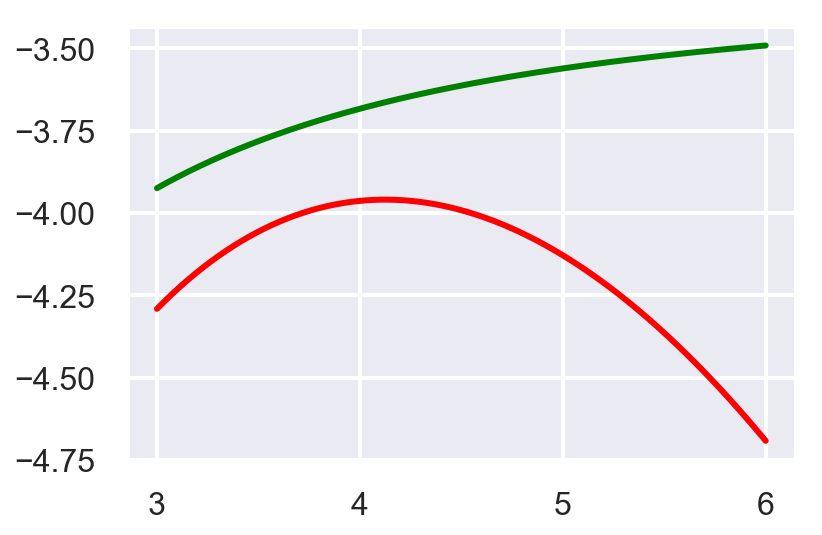

In [91]:
plt.plot(freq, (bsc1), 'r')
plt.plot(freq, bsc2, 'g')
plot.plot(freq, np.log(bsc_o),'b')

In [38]:
esd, eac = get_ESD_EAC(freq, bsc_o)

In [ ]:
bsc_o = np.mean(np.vstack(rabbit_bsc), axis=1)

In [63]:
y1 = np.log(bsc_o/(freq**4))
slope, intercept = np.polyfit(freq**2, y1,1)

In [68]:
sos = 1540
D = np.sqrt(slope/(-0.827* np.pi**2)*(sos**2))

In [69]:
D

163.58482860823378

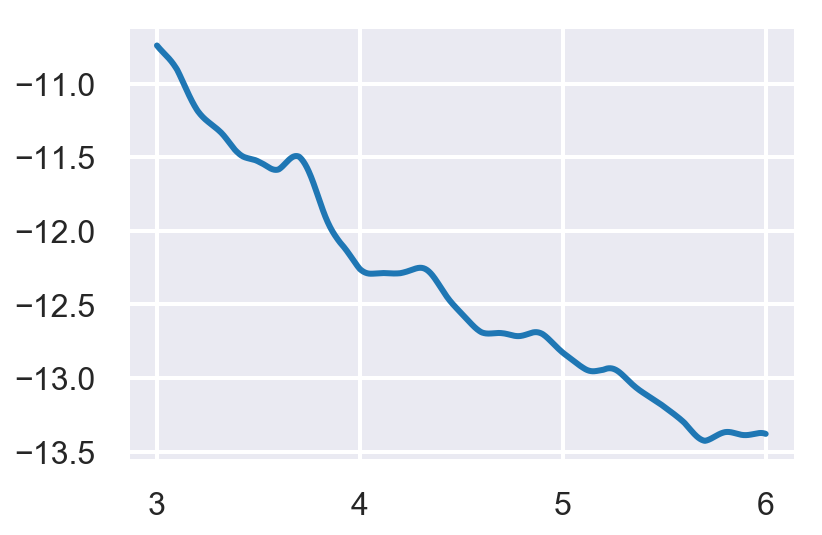

In [41]:
plt.plot(freq, np.log(bsc_o/(freq**4)))

In [43]:
from sklearn.metrics import mean_squared_error

In [56]:
min_mse = 1000
max_eac = 100
for esd in np.arange(10, 250):
    for eac in np.arange(10, max_eac):
        mse = mean_squared_error(np.log(bsc_o), gaussian_form_factor_bsc(esd, 10**(eac/10.0), freq))
        if mse < min_mse:
            min_mse = mse
            esd_0, eac_0 = esd, eac
        
print(esd_0, eac_0)

163 25


In [58]:
mean_squared_error(np.log(bsc_o), bsc1)

0.038743504596266715

In [74]:
esd_ex, eac_ex = get_ESD_EAC(freq, bsc_o, type ='exponential')

exponential


In [75]:
print(esd_ex, eac_ex)

246.4420540114642 32.218534021674415


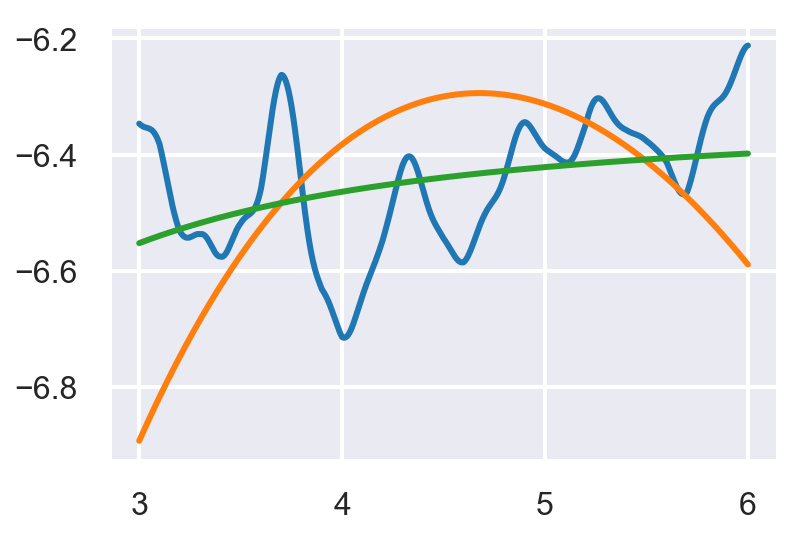

In [76]:
plt.plot(freq, np.log(bsc_o))
bsc1 = gaussian_form_factor_bsc(esd_0, 10**(eac_0/10.0), freq)
bsc2 = exponential_form_factor_bsc(esd_ex, 10**(eac_ex/10.0), freq)
plt.plot(freq, (bsc1))
plt.plot(freq, bsc2)

## Average BSC for two lipid classes

In [110]:
from sklearn.metrics import mean_squared_log_error as MSLE

In [111]:
MSLE(bsc_low_lipid, bsc_high_lipid)

NameError: name 'bsc_low_lipid' is not defined

141.37000289179463 31.70991288727723
161.01960765922763 22.86387347389256


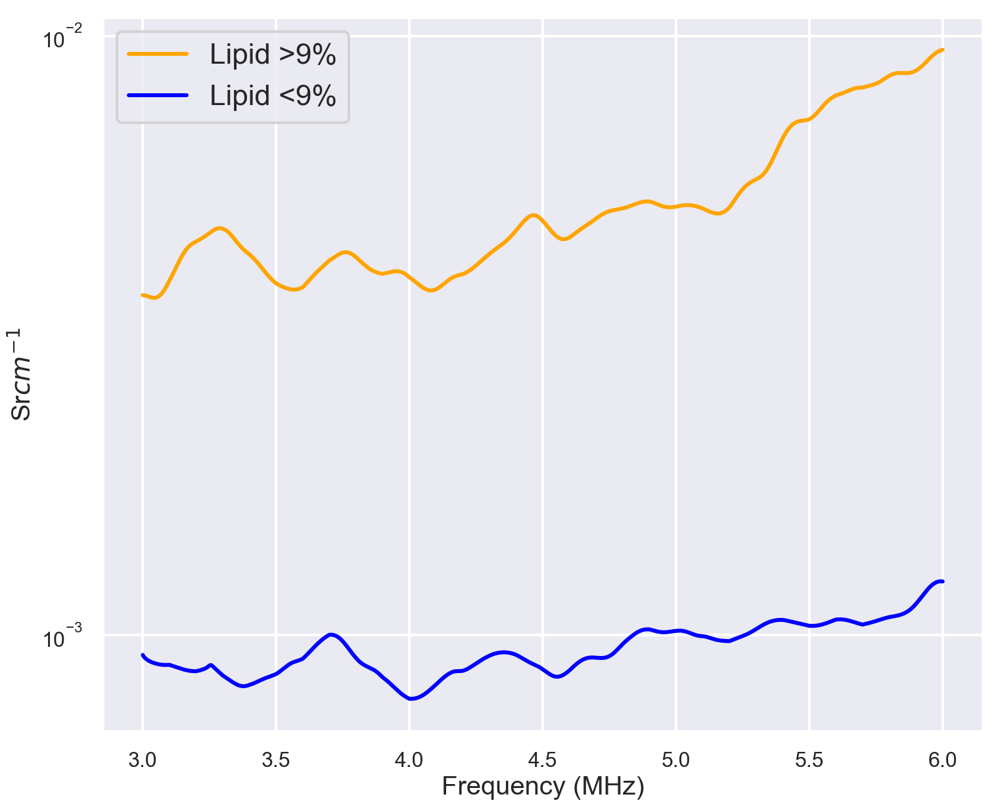

In [142]:
plt.figure(figsize = (12, 10))
bsc_low_lipid = np.mean(np.vstack(mean_blue), axis = 0)
bsc_high_lipid = np.mean(np.vstack(mean_red), axis = 0)
plt.semilogy(freq, bsc_high_lipid, color='orange', \
             label = 'Lipid >' + str(threshold_lipid)+ '%')

esd, eac = get_ESD_EAC(freq, bsc_high_lipid, type = 'gaussian')
print(esd, eac)

plt.semilogy(freq, bsc_low_lipid, color='blue',  \
             label = 'Lipid <' + str(threshold_lipid)+ '%')

esd, eac = get_ESD_EAC(freq, bsc_low_lipid, type = 'gaussian')
print(esd, eac)
plt.xlabel('Frequency (MHz)')
plt.ylabel('Sr$cm^{-1}$')
plt.legend()
#plt.ylim([10**-4, 10**-2])

In [163]:
from scipy.io import savemat

bsc_python = {}
bsc_python['freq'] = freq
bsc_python['bsc'] = np.mean(np.vstack(mean_blue), axis = 0)

In [164]:
savemat('bsc_python_blue.mat', bsc_python)

## Average BSC for two classes

/Users/trongnguyen/anaconda3/lib/python3.6/site-packages/seaborn/timeseries.py:183: UserWarning: The `tsplot` function is deprecated and will be removed in a future release. Please update your code to use the new `lineplot` function.
  warnings.warn(msg, UserWarning)


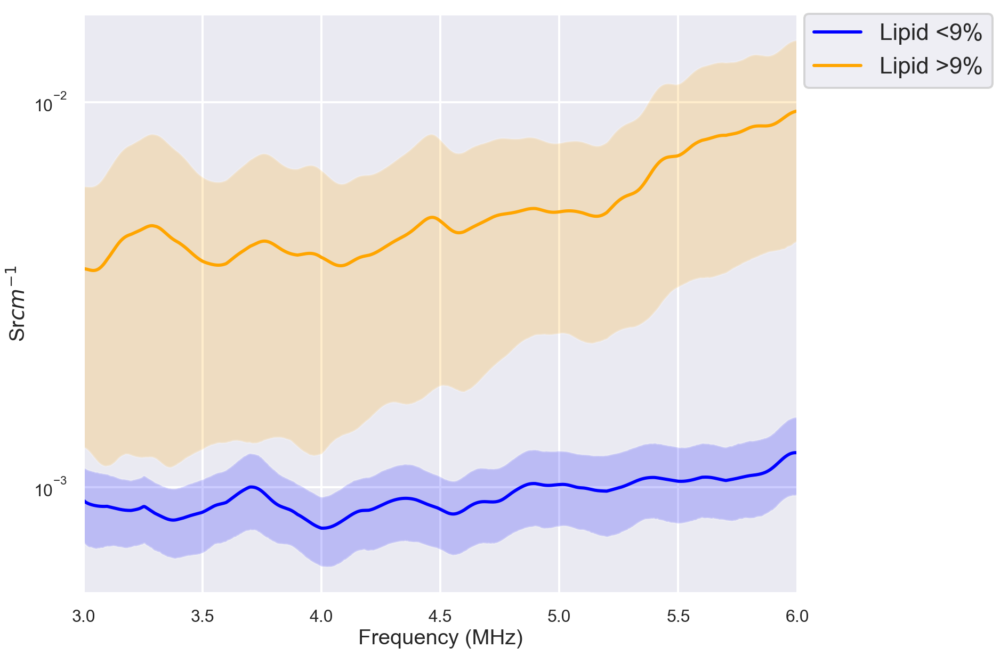

In [143]:
f, ax = plt.subplots(figsize=(12, 10))
ax.set(yscale="log")
sns.tsplot(data = np.vstack(mean_blue), time = freq,  color = 'blue', condition = 'Lipid <' + str(threshold_lipid)+ '%')
sns.tsplot(data = np.vstack(mean_red),time = freq,  color = 'orange', condition = 'Lipid >' + str(threshold_lipid)+ '%')
ax.set_xlabel('Frequency (MHz)')
ax.set_ylabel('Sr$cm^{-1}$')
#ax.set_ylim([ 10**-4,10**-2])
plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)

In [23]:
df = pd.DataFrame({'ESD':pd.Series(esd_dict),'EAC':pd.Series(eac_dict)})
df['Lipid'] = df.index
df['High'] = df.Lipid > threshold_lipid
df['High_fat'] = df['High'].apply(lambda x: 'High lipid' if x else 'Low lipid')

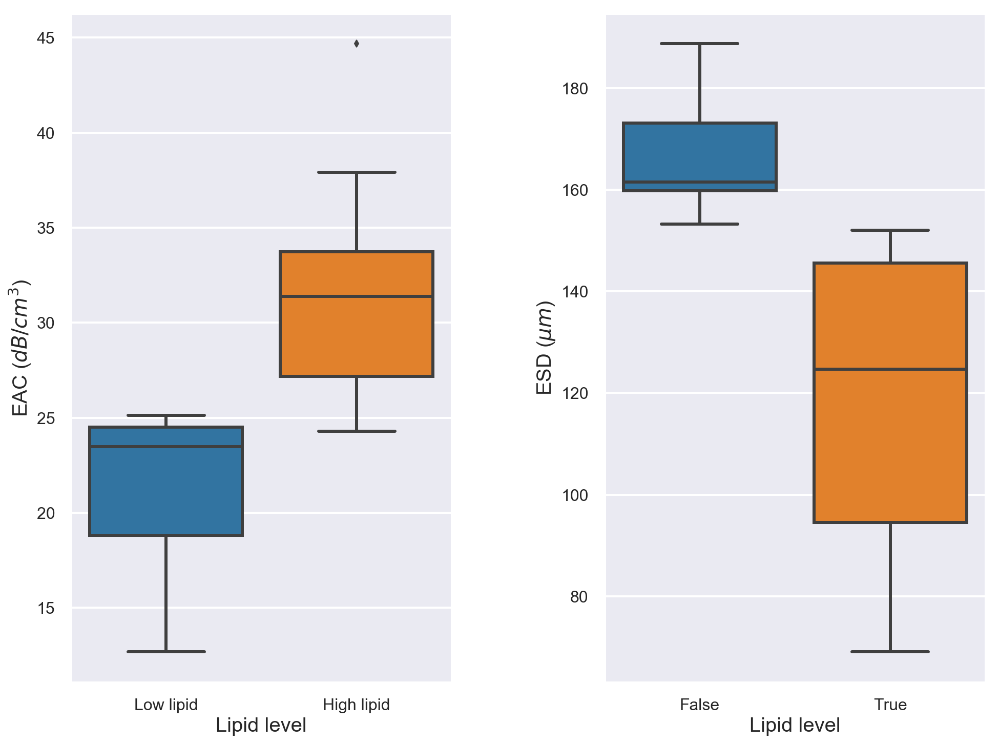

In [24]:
plt.figure(figsize = (16, 12))
plt.subplot(121)
sns.boxplot(x = 'High_fat', y = 'EAC', data = df)
plt.ylabel('EAC ($dB/cm^3$)')
plt.xlabel('Lipid level')
plt.subplot(122)
sns.boxplot(x = 'High', y = 'ESD', data = df)
plt.ylabel('ESD ($\mu m$)')
plt.xlabel('Lipid level')
plt.subplots_adjust(wspace = 0.4)

In [25]:
ttest_ind(df.EAC[df.High == False], df.EAC[df.High == True])

Ttest_indResult(statistic=-3.356881595360121, pvalue=0.005152084858389939)

In [26]:
ttest_ind(df.ESD[df.High == False], df.ESD[df.High == True])

Ttest_indResult(statistic=3.7813500415639756, pvalue=0.0022869625558398906)

In [27]:
df['EAC'].groupby(df['High']).describe()

,count,mean,std,min,25%,50%,75%,max
High,,,,,,,,
False,7.0,21.134060,5.227383,12.683282,18.824440,23.490062,24.499519,25.117159
True,8.0,31.822643,6.846228,24.302240,27.171398,31.397215,33.746073,44.678463


In [28]:
df['ESD'].groupby(df['High']).describe()

,count,mean,std,min,25%,50%,75%,max
High,,,,,,,,
False,7.0,167.046934,13.261852,153.222164,159.801066,161.525480,173.130171,188.718417
True,8.0,118.934755,31.171721,69.065644,94.538731,124.673669,145.525851,152.050931


In [29]:
df['Labels'] = df['High'].apply(lambda x: 'High lipid' if x else 'Low lipid')

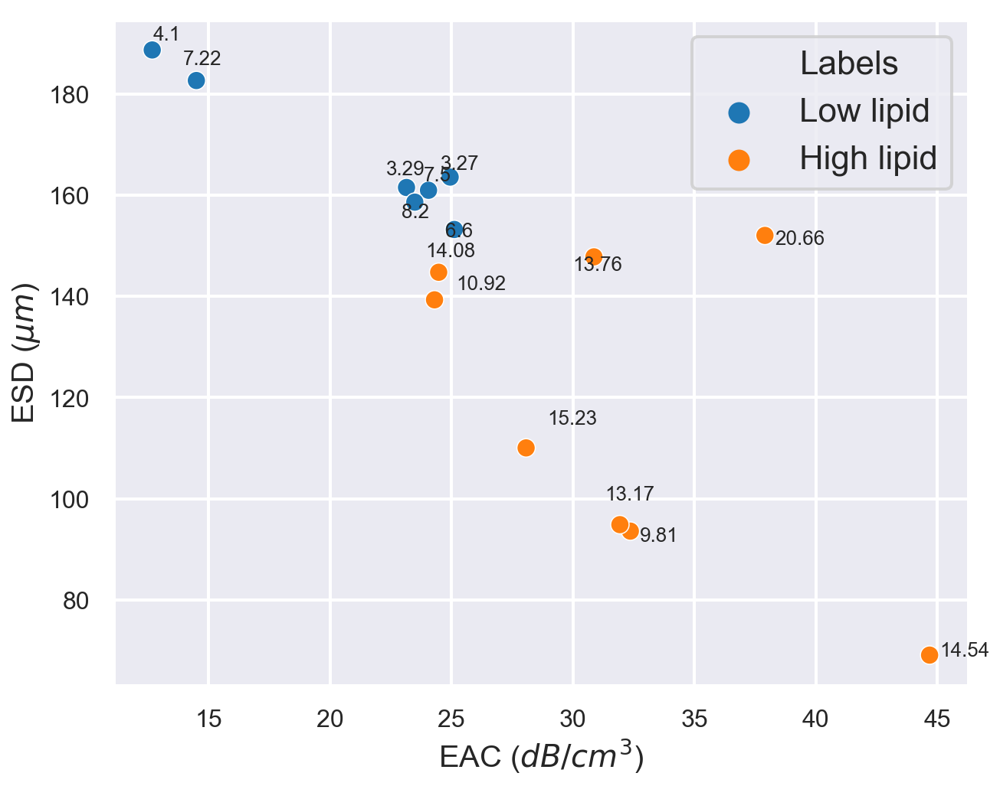

In [81]:
plt.figure(figsize = (10, 8))
ax = sns.scatterplot(x = 'EAC', y = 'ESD', data = df, hue = 'Labels')

pos1s = [0.69, 0.24,0.08, -0.5 , 0.62, 0.25,0.23, 0.41, -0.43, -0.83,  0.07,  0.06,0.74, -0.5 , 0.91]
pos2s = [-2.07, 0.93, 3.94, -4.75, 4.44, -0.12, 2.14, -3.43, -3.34,  2.77,  0.83,  4.83,-4.16, -2.3,0.53]
ax.set_ylabel('ESD ($\mu m$)')
ax.set_xlabel('EAC ($dB/cm^3$)')
for idx, row in df.iterrows():
    pos1 = (np.random.rand(1)-0.5)*2
    pos2 = (np.random.rand(1) - 0.5)*10
    pos1s.append(pos1[0])
    pos2s.append(pos2[0])
    #pos1 = 0
    #print(row.Lipid)
    #pos2 = 0
    #ax.annotate(str(df['Lipid'][idx]), xy=(df['EAC'][idx],df['ESD'][idx]), \
    #            xytext=(df['EAC'][idx]+pos1,df['ESD'][idx]+pos2 ),
    #        arrowprops=dict(facecolor='black', shrink=0.05),
    #        )

    ax.text(df['EAC'][idx]+pos1, df['ESD'][idx]+pos2,\
            df['Lipid'][idx], fontsize = 13)
#plt.legend(loc='lower right')

In [26]:
row

EAC            37.9013
ESD            152.051
Lipid            20.66
High              True
High_fat    High lipid
Labels      High lipid
Name: 20.66, dtype: object

In [166]:
print(np.round(pos1s,2))
print(np.round(pos2s,2))

[ 0.69  0.24  0.08 -0.5   0.62  0.25  0.23  0.41 -0.43 -0.83  0.07  0.06
  0.74 -0.5   0.91  0.12  0.53  0.62  0.35  0.26  0.91 -0.03 -0.32 -0.11
  0.28  0.09 -0.58  0.51 -0.55 -0.82]
[-2.07  0.93  3.94 -4.75  4.44 -0.12  2.14 -3.43 -3.34  2.77  0.83  4.83
 -4.16 -2.3   0.53 -4.33 -2.79 -3.45 -4.27  4.85  4.25  2.81 -4.06  4.33
 -4.83  0.28  3.89 -2.22 -4.25 -2.45]


# BSCs for each rabbits

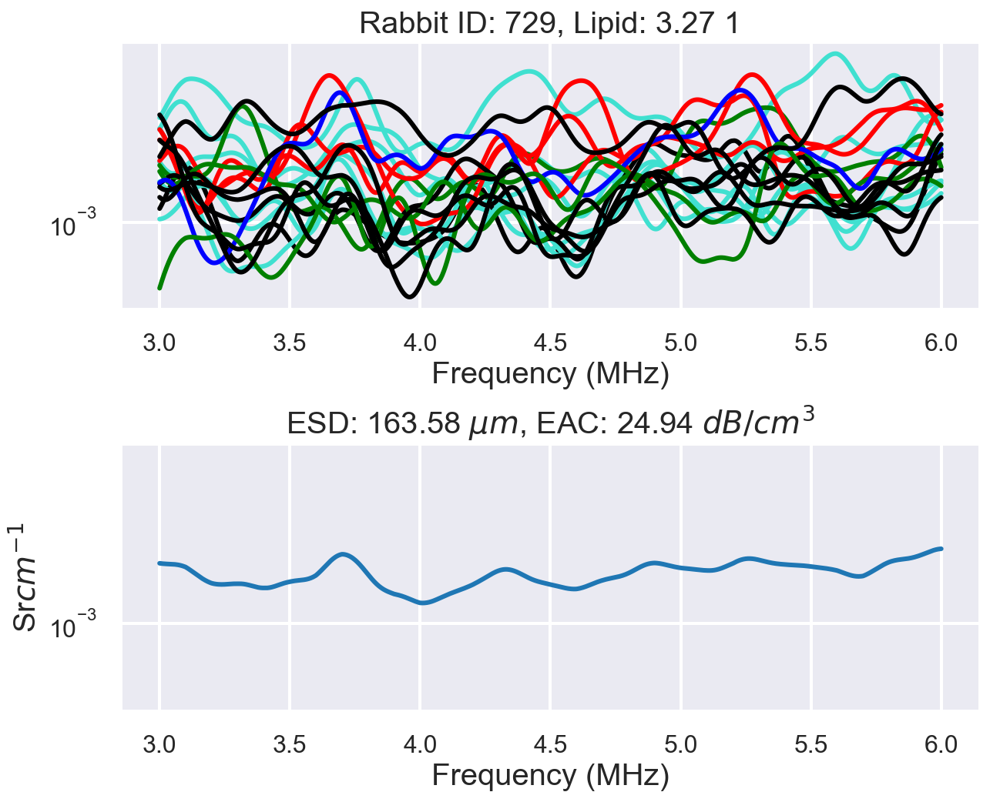

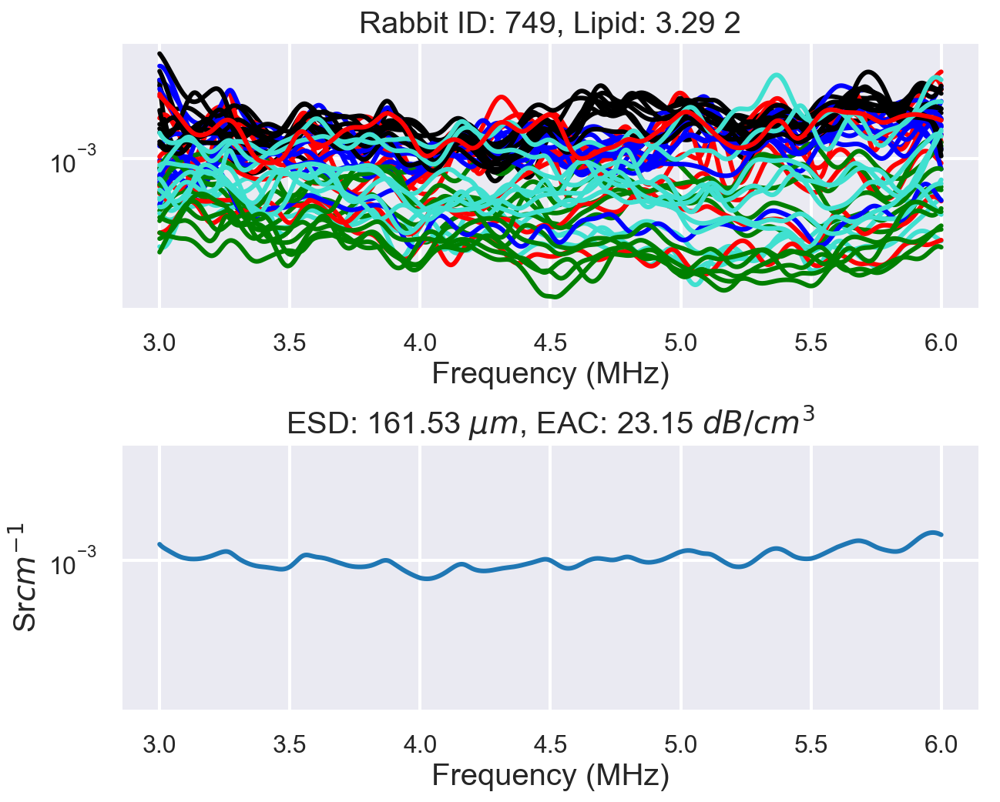

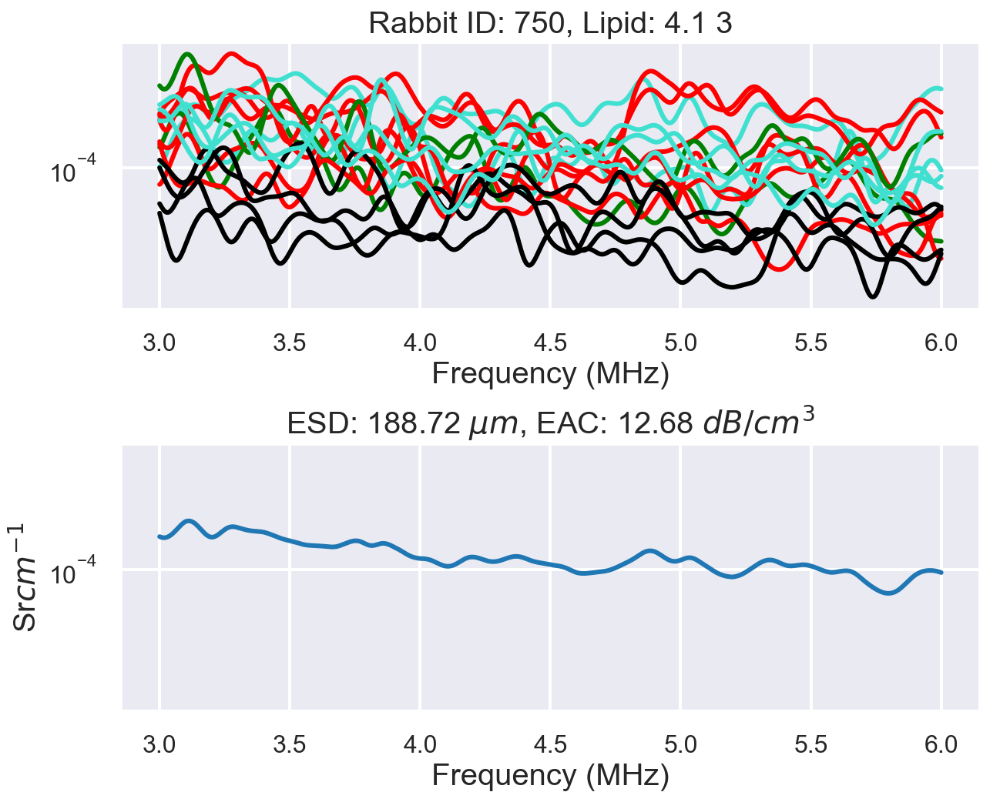

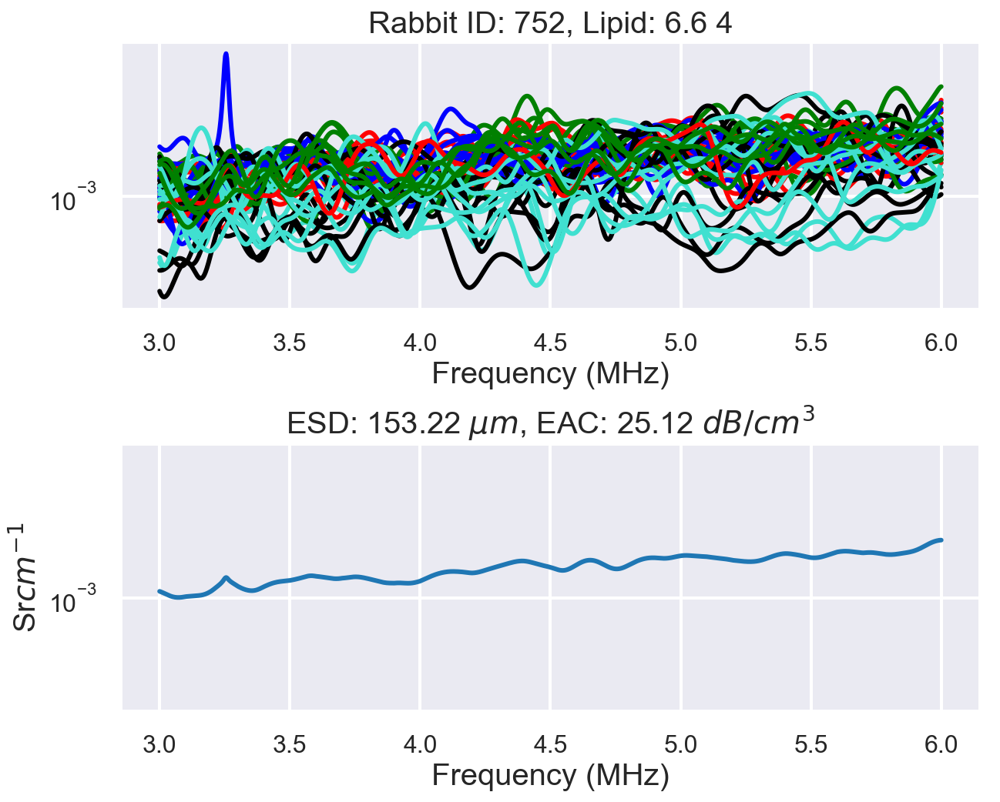

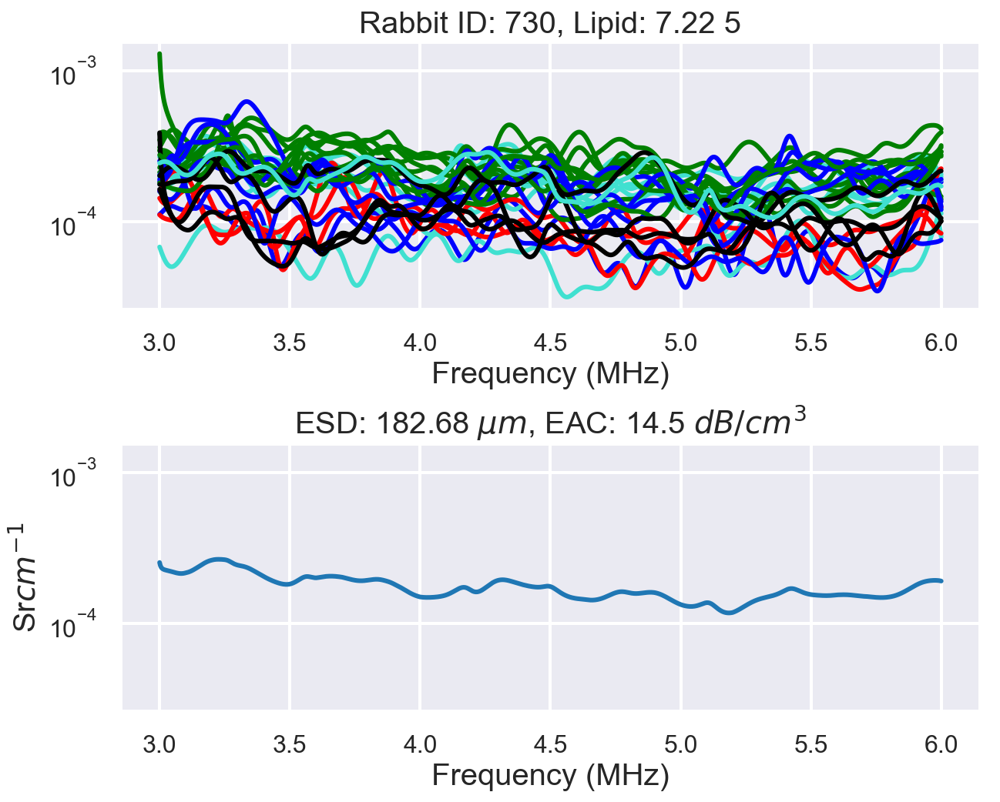

...

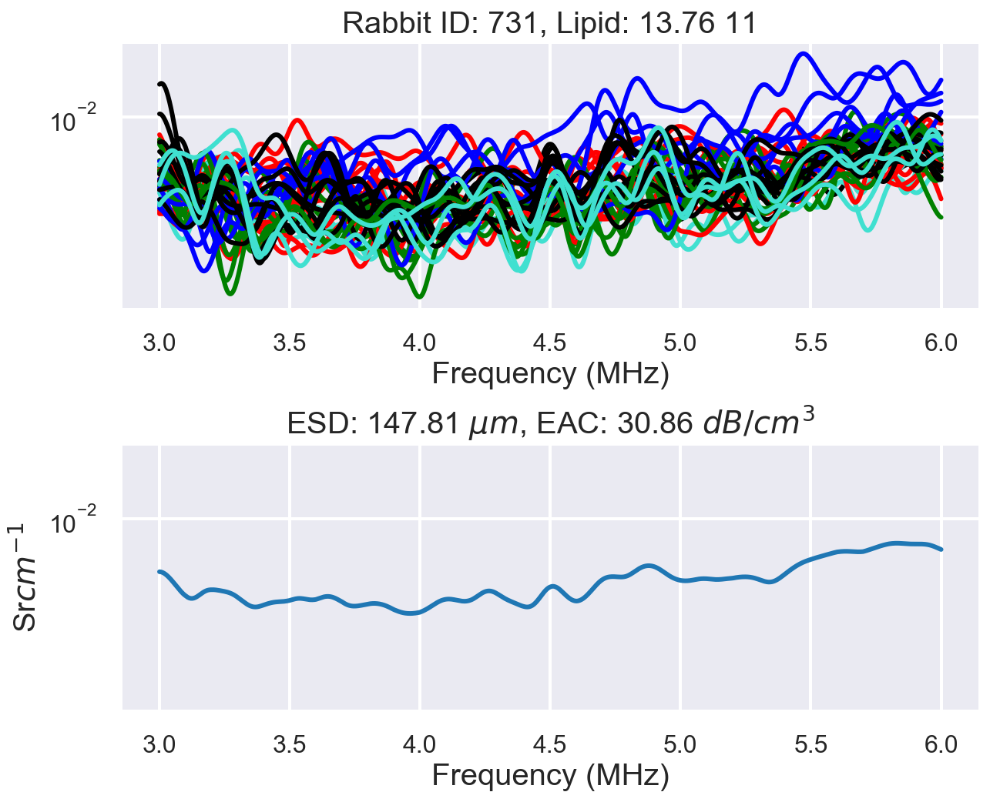

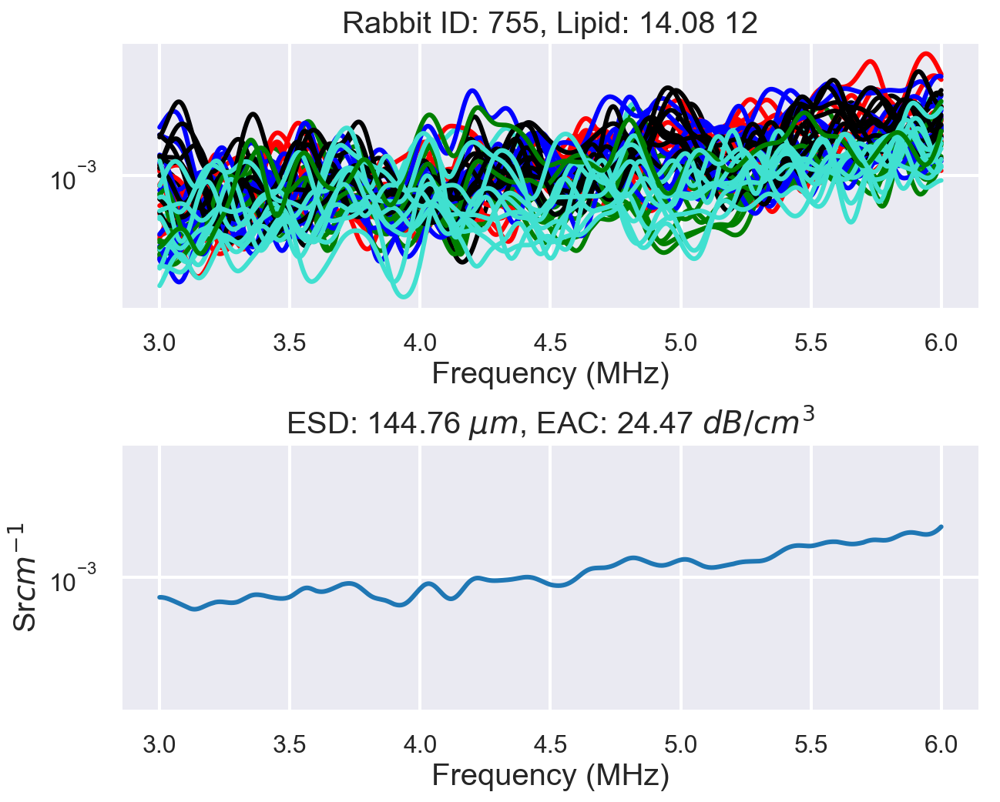

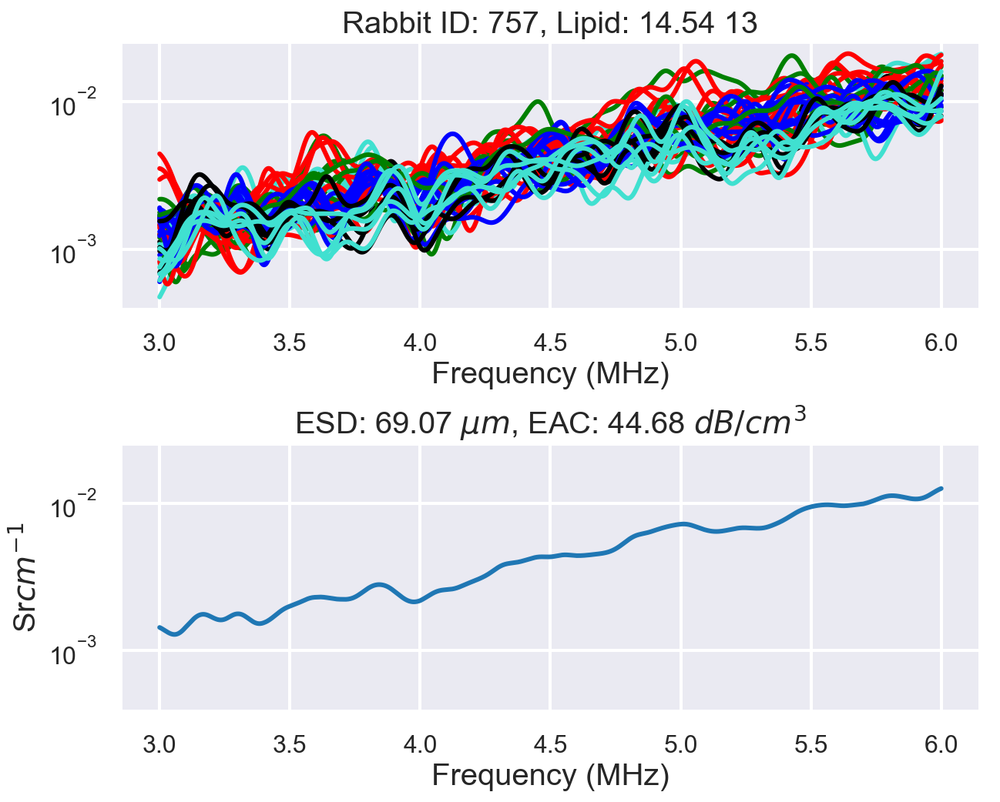

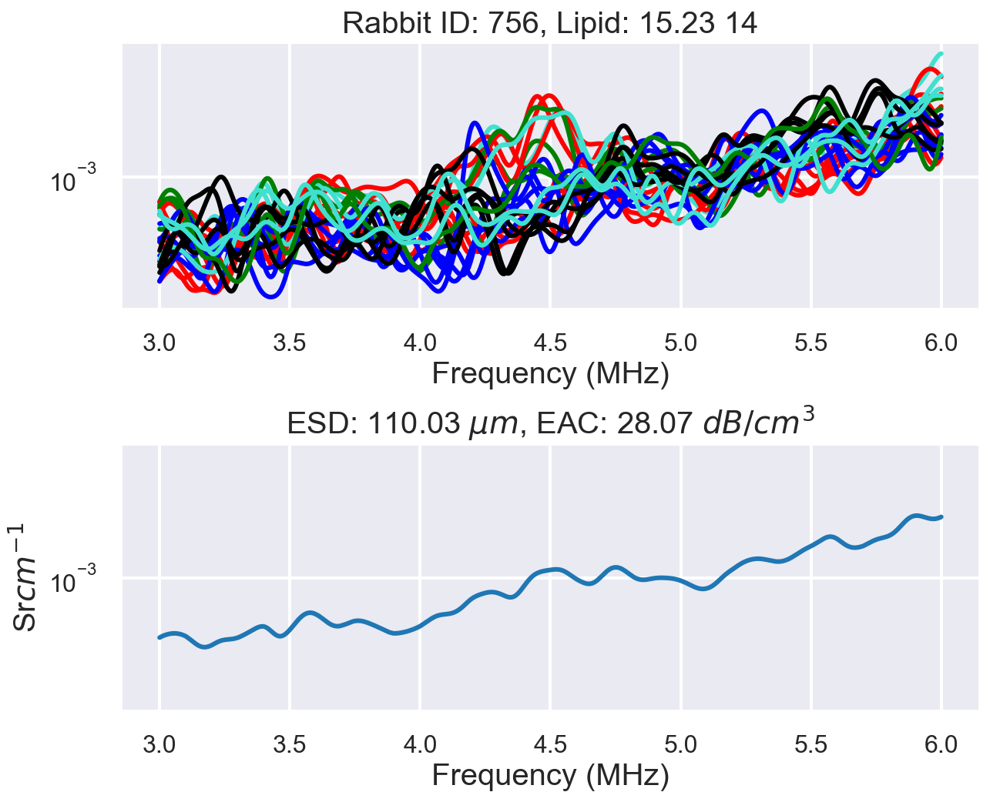

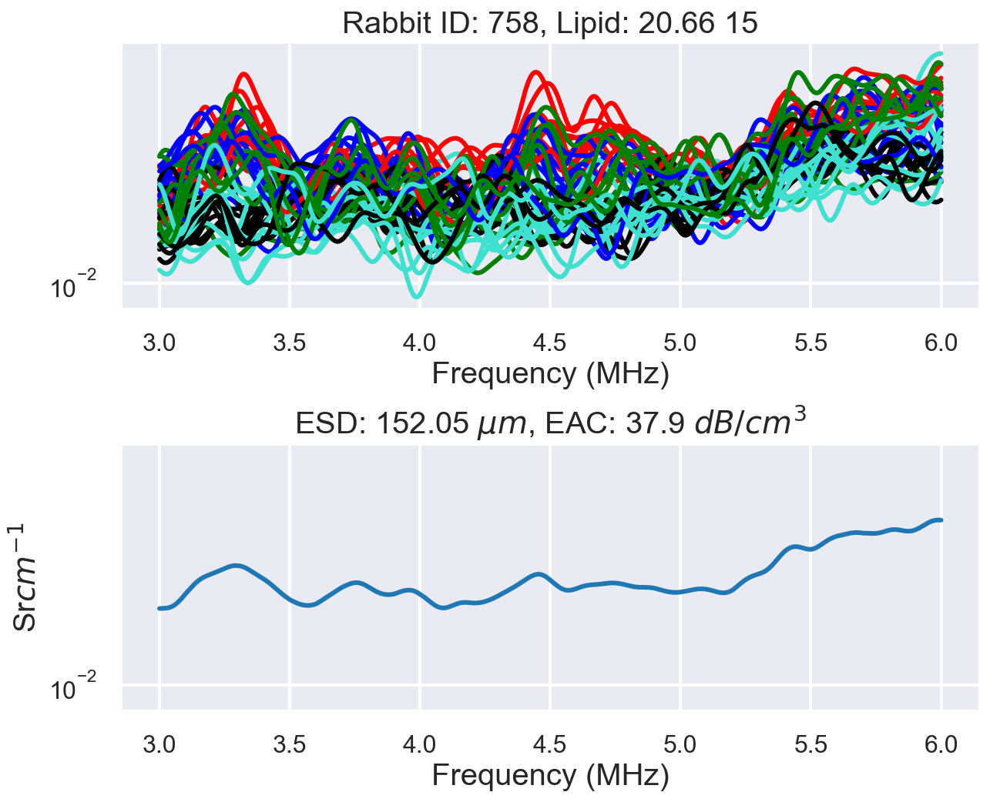

In [22]:
esd_dict = {}
eac_dict = {}

count = 0
for idx, row in dataBase.iterrows():
    count = count + 1
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    bscs = BSCs_dict[rabbit_number]
    depth = depth_dict[rabbit_number]
    
    if (len(bscs) == 0):
        continue
    freq_key = next(iter(freq_bsc_dict[rabbit_number]))
    freq = freq_bsc_dict[rabbit_number][freq_key].flatten()
    
    f, (ax1, ax2) = plt.subplots(2, 1, sharey = True, figsize = (10, 8))

    rabbit_bsc = []
    for frame_ in bscs:
        if (bscs[frame_].shape[1] > 0):
            avg_bsc = np.mean(bscs[frame_], axis = 1)
            no_rois = bscs[frame_].shape[1]
            max_depth = np.round(np.max(depth[frame_]))
            min_depth = np.round(np.min(depth[frame_]))
            range_depth = str(min_depth) +'-' +str(max_depth)
            if (no_rois >0):
                ax1.semilogy(freq, avg_bsc, color = filter_frame(frame_), label = str(frame_))
                rabbit_bsc.append(avg_bsc)
    
    ax2.semilogy(freq, np.mean(np.vstack(rabbit_bsc), axis = 0))
    try:
        temp2, idxs = filter_bsc(np.vstack(rabbit_bsc).T)
        esd, eac = get_ESD_EAC(freq, np.mean(temp2, axis = 1))
        esd_dict[lipid] = esd
        eac_dict[lipid] = eac
    except:
        esd = 0
        eac = 0
    
    ax1.set_title("Rabbit ID: " + rabbit_number + ", Lipid: " + str(lipid) +" "+ str(count))
    #ax1.set_ylim([10**-5, 10])
    ax1.set_xlabel('Frequency (MHz)')
    ax2.set_xlabel('Frequency (MHz)')
    ax2.set_ylabel('Sr$cm^{-1}$')
                           
    ax2.set_title("ESD: " + str(np.round(esd,2)) + " $\mu m$, EAC: " \
                  + str(np.round(eac, 2)) + " $dB/cm^3$")
    f.subplots_adjust(hspace = 0.5)
    #plt.legend(bbox_to_anchor=(1.1, 1.05), ncol=3)
    #plt.xlabel('Frequency (MHz)')
    #plt.ylabel('Sr$cm^{-1}$')
    plt.show()

# ATT for each rabbit

In [13]:
ATTs_dict['729'].keys()

dict_keys(['43', '44', '45', '46', '47', '5', '6', '7', '8', '9', '1', '10', '11', '12', '15', '18', '19', '20', '21', '22', '23', '24', '25', '26', '2', '27', '35', '42', '28', '29', '3', '30', '31', '32', '34', '36', '37', '38', '39', '4', '40', '41'])

729
NY729
749


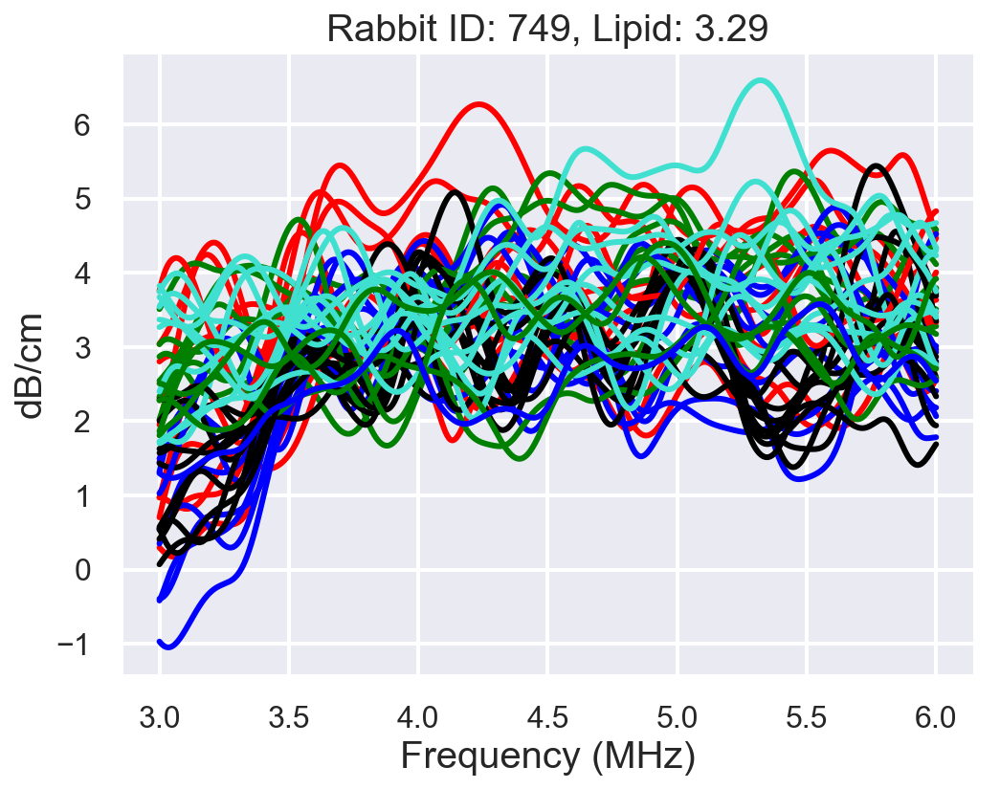

750


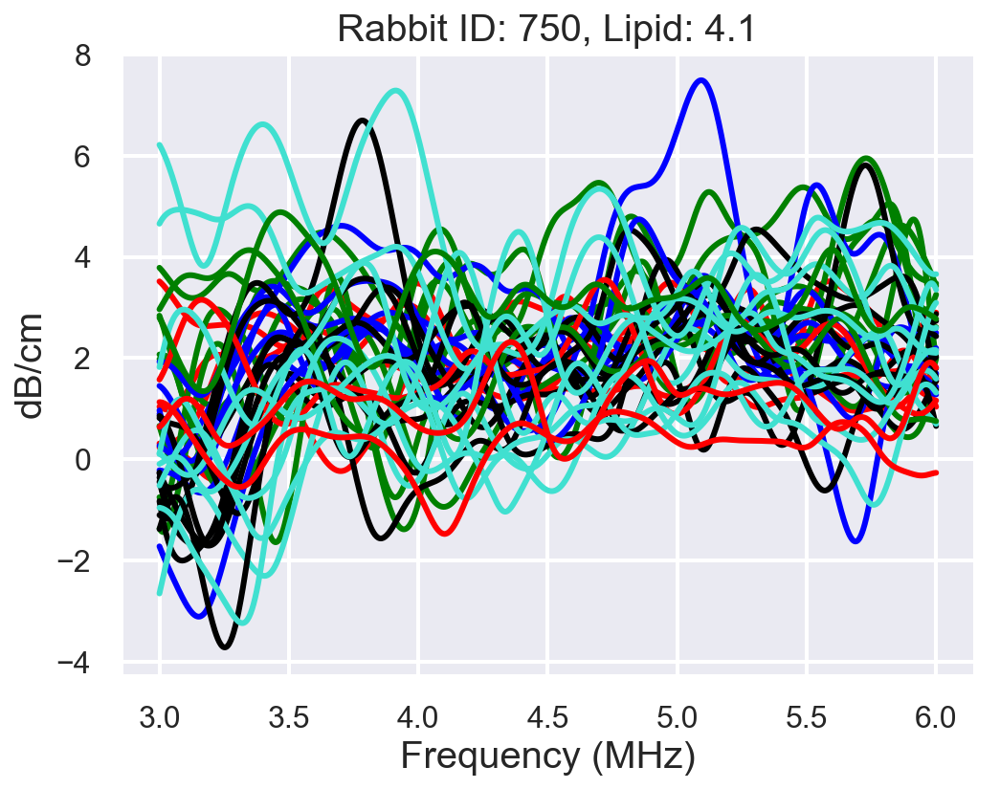

752


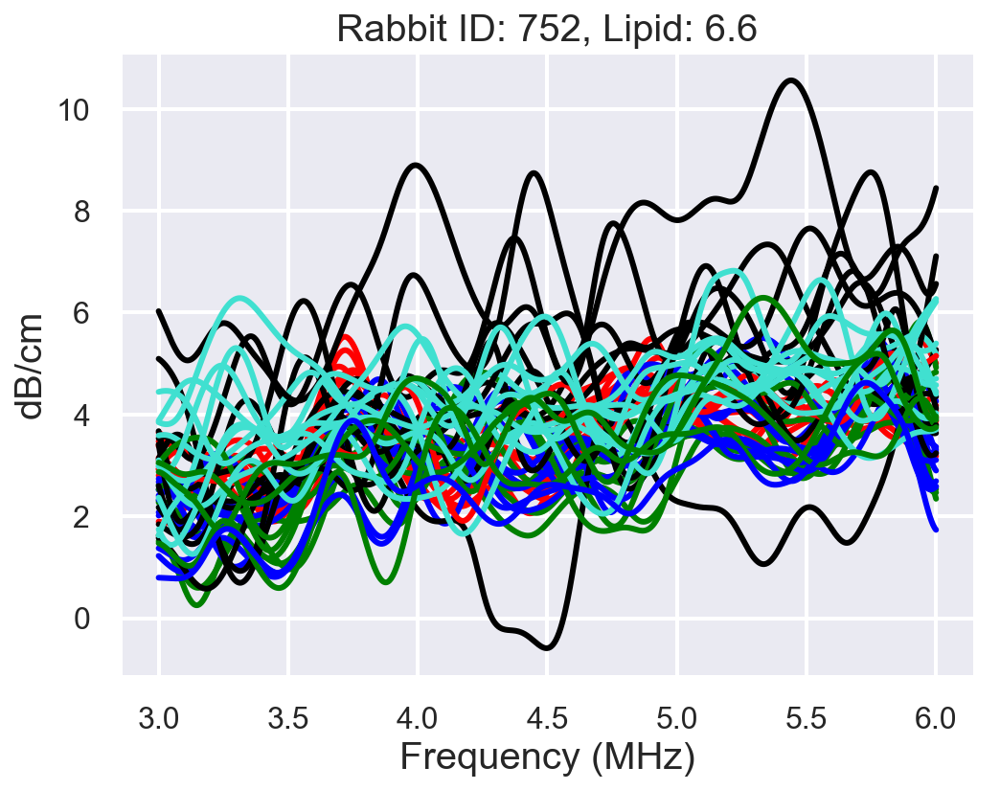

730


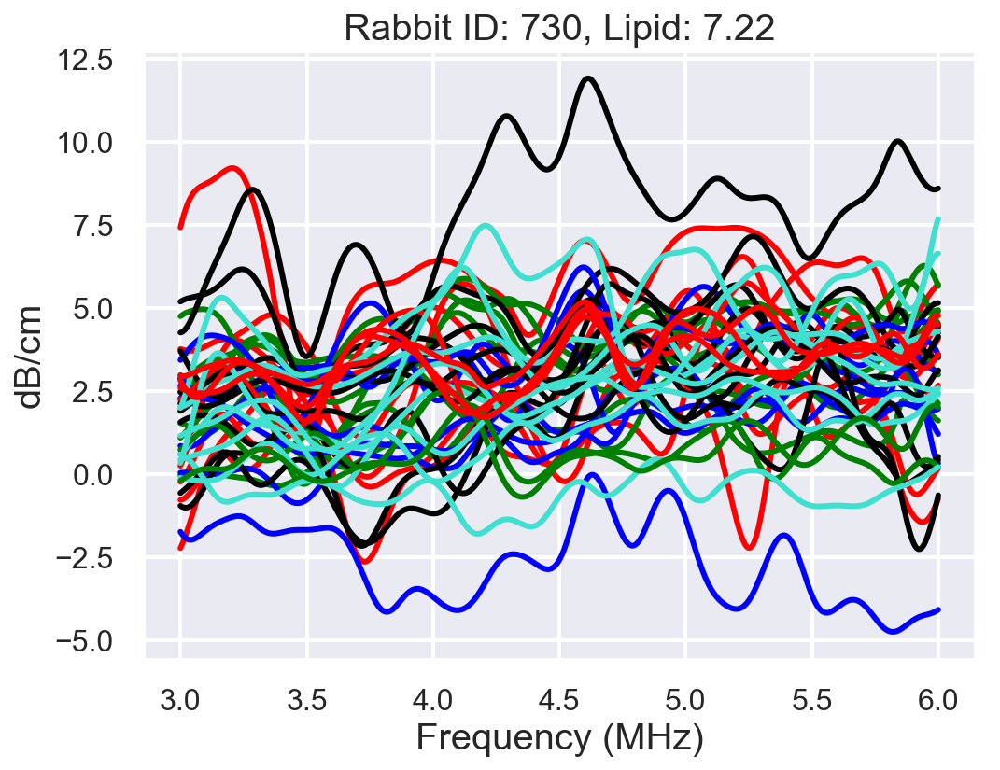

739


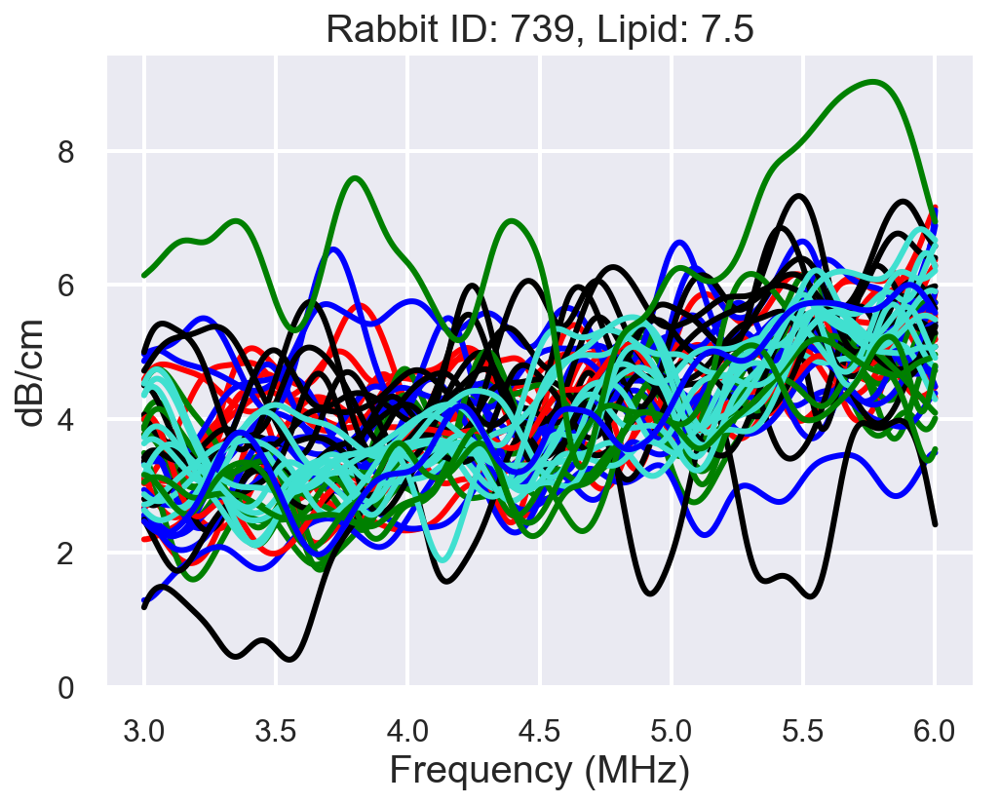

751


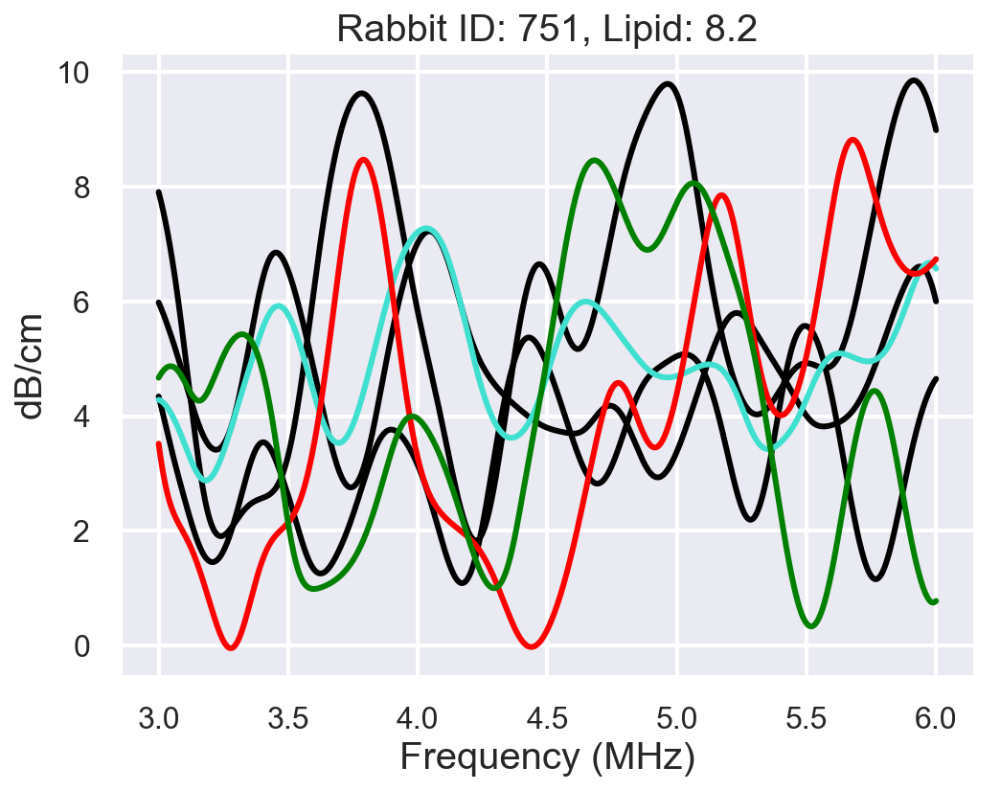

754


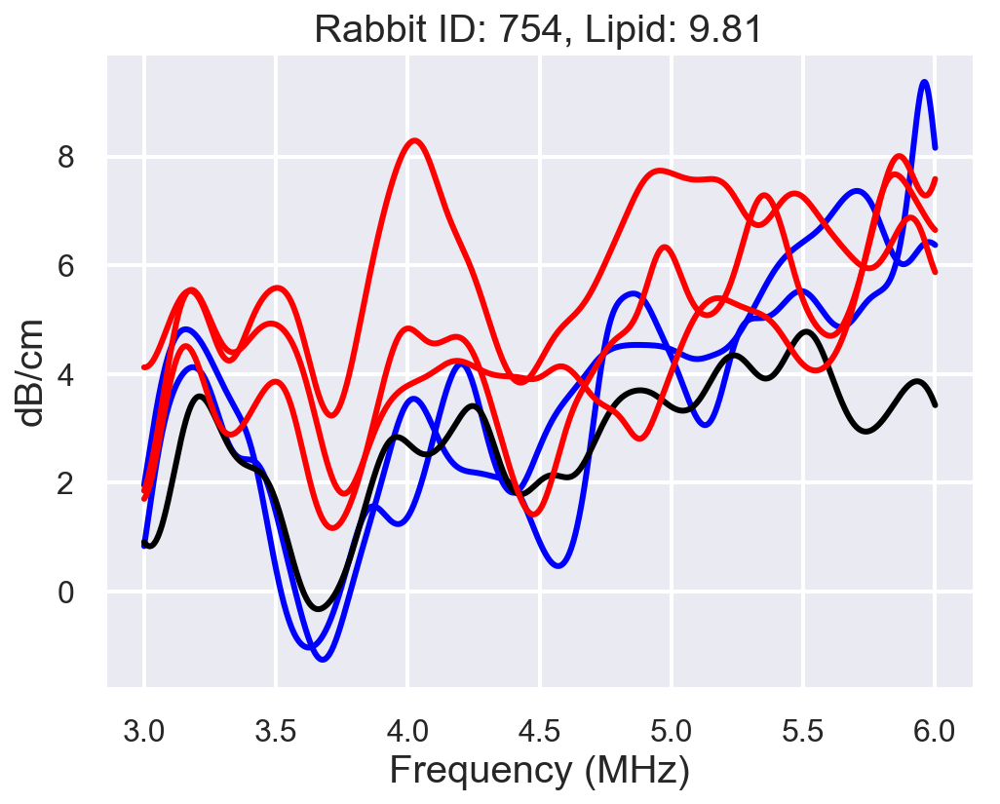

753


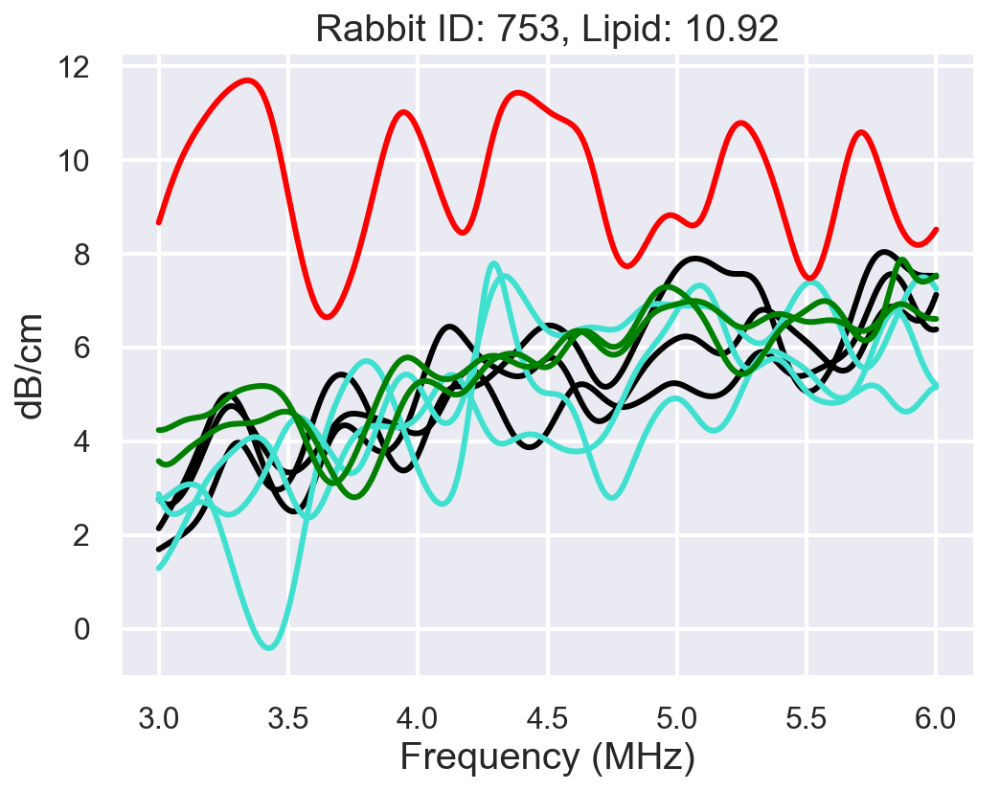

740


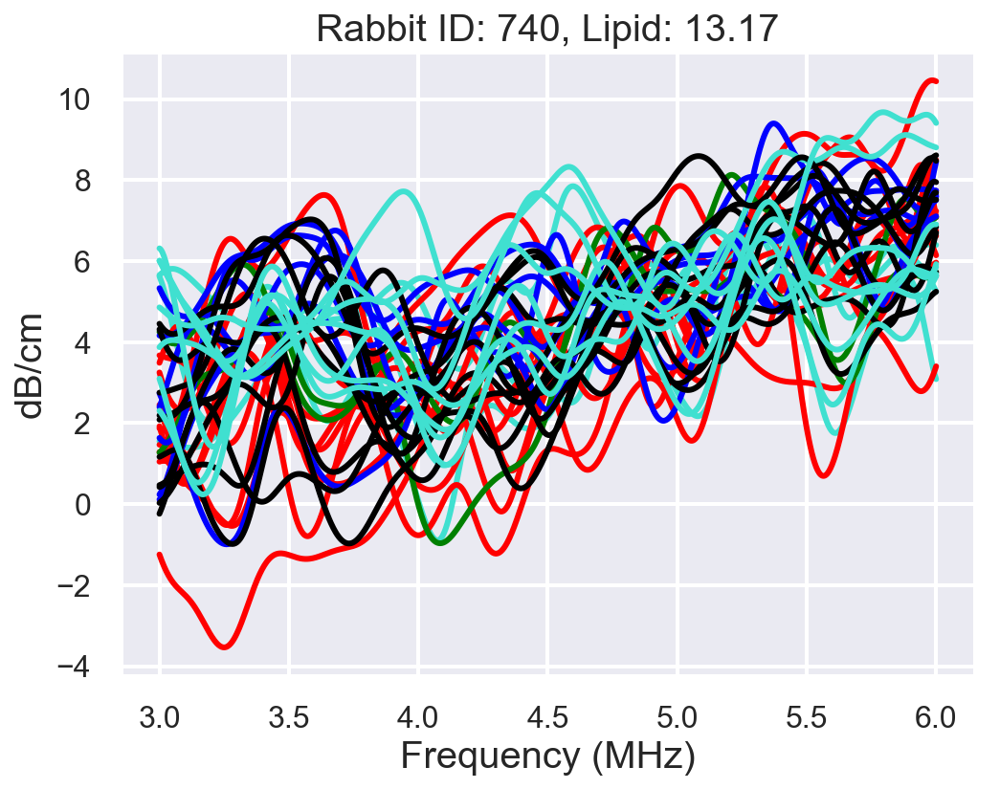

731


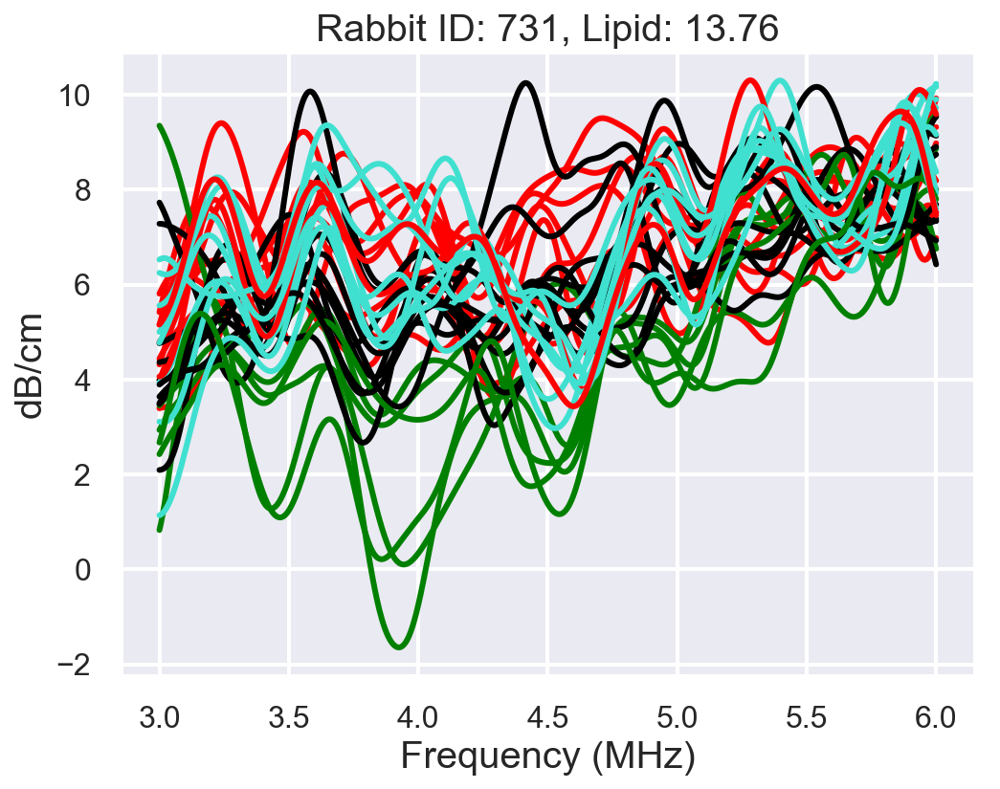

755


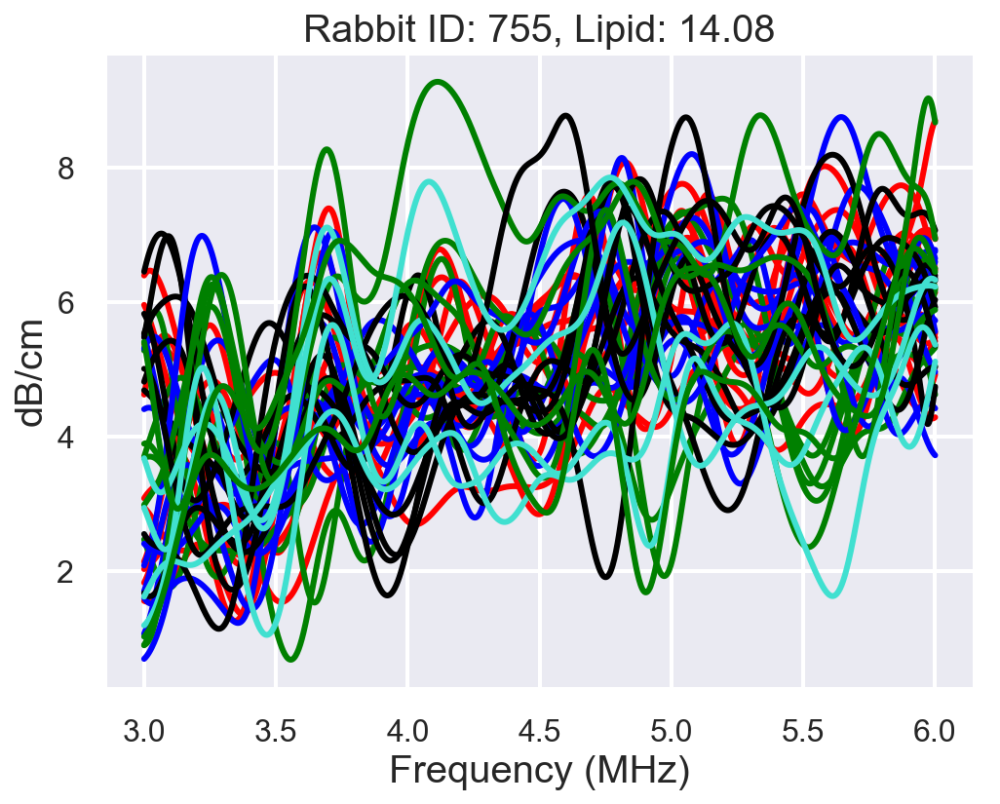

757


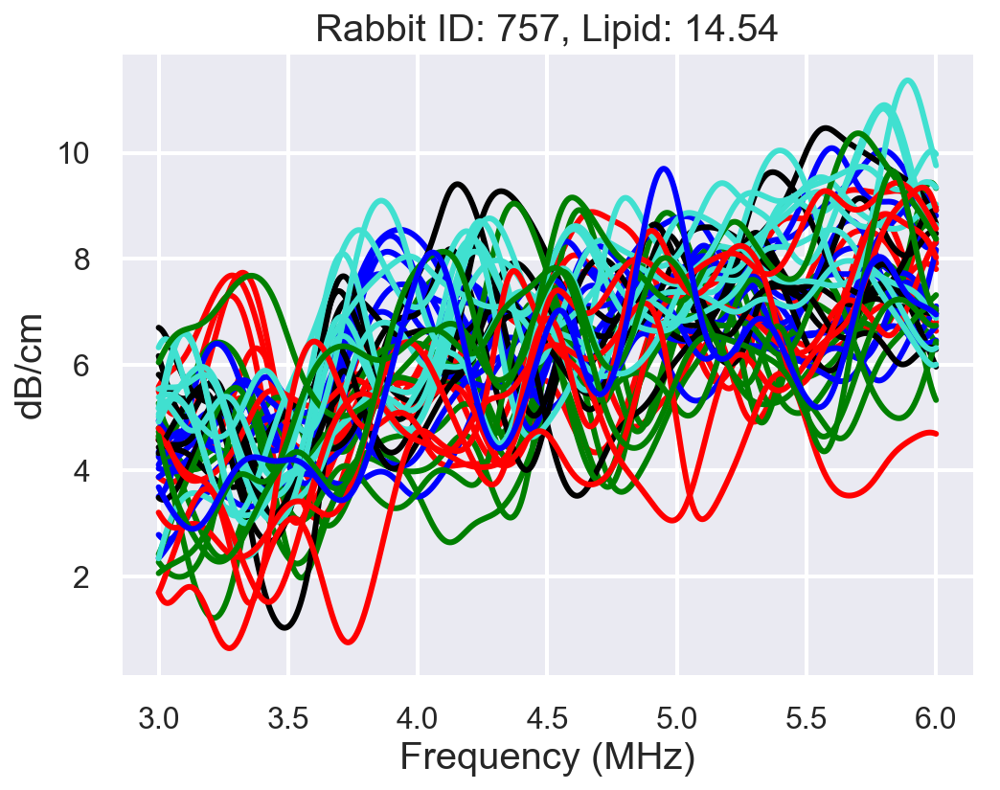

756


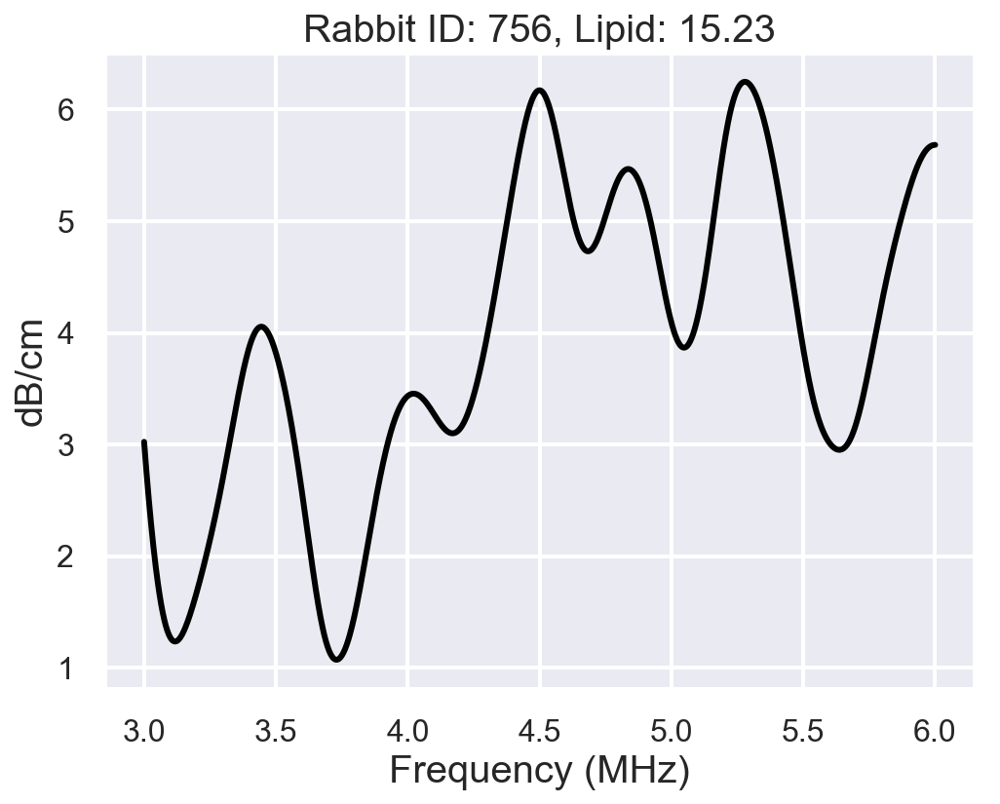

758


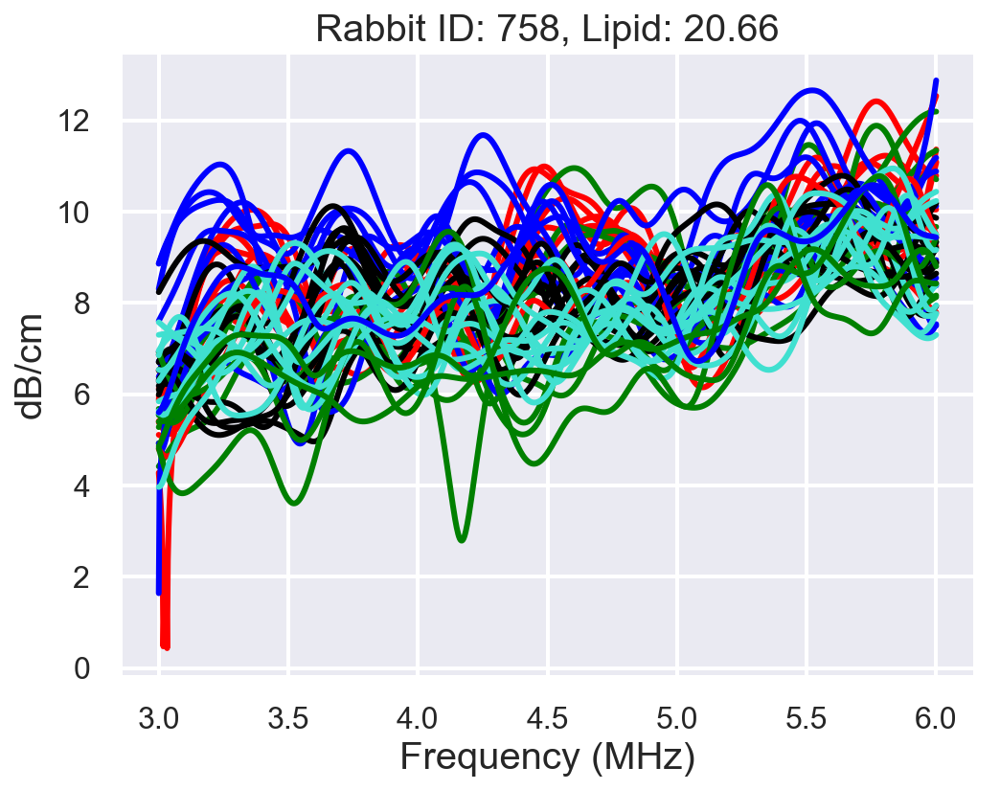

In [124]:
for idx, row in dataBase.iterrows():
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    atts = ATTs_dict[rabbit_number]
    depth = depth_dict[rabbit_number]
    print(rabbit_number)
    if (len(atts) == 0):
        print("NY" + rabbit_number)
        continue
    freq_key = next(iter(freq_att_dict[rabbit_number]))
    freq = freq_att_dict[rabbit_number][freq_key].flatten()
  
    plt.figure(figsize = (8, 6))
    for frame_ in atts:
        if (atts[frame_].shape[1] > 0):
            avg_att = np.mean(atts[frame_], axis = 1)
            #no_rois = bscs[frame_].shape[1]
            #mean_depth = np.round(np.max(depth[frame_]))
            #if (no_rois >0):
            plt.plot(freq, avg_att, color = filter_frame(frame_))
    plt.title("Rabbit ID: " + rabbit_number + ", Lipid: " + str(lipid))
    
    #plt.legend(bbox_to_anchor=(1.1, 1.05), ncol=3)
    plt.xlabel('Frequency (MHz)')
    plt.ylabel('dB/cm')
    plt.show()

In [405]:
atts = ATTs_dict['729']

In [ ]:
for key in atts:
    plt.figure()
    print(atts[key].shape)
    plt.plot(atts[key])

import holoviews as hv
hv.extension('bokeh')

In [46]:
def filter_class(x):
    if x > 10:
        color = 'red'
    else:
        color = 'blue'
    return color

In [23]:
from helper_brl.ml_preprocessing import percentageVariance, cal_accuracy, randomize_and_filter

In [28]:
X_train, y_train = get_training_data(dataBase, testing_idx, ATTs_dict, freq_att_dict, depth_dict,False)
X_test, y_test, frame_idx, frame_break = get_testing_data(dataBase, testing_idx, ATTs_dict, freq_att_dict, depth_dict, False)

X_train, y_train, X_test, y_test, idxs1, idxs2 = randomize_and_filter(X_train, y_train, \
                                                                      X_test, y_test)   



729,749,750,Skip,730,739,751,754,753,740,731,755,757,756,758,Skip, Skip, Skip, 752,Skip, Skip, Skip, Skip, Skip, Skip, Skip, Skip, Skip, Skip, Skip, 

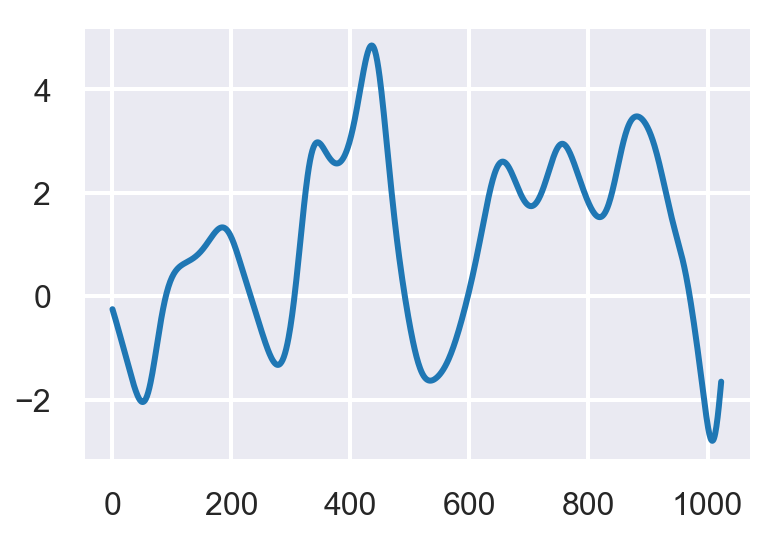

In [31]:
plt.plot(X_train[900,:])

In [30]:
X_test.shape

(228, 1024)

In [44]:
from helper_brl.combineFeatures import combine_bscs_atts  

testing_idx = [752]
X_train, y_train = combine_bscs_atts(dataBase, testing_idx, freq, \
                                         BSCs_dict, ATTs_dict, training = True)



In [48]:
dataBase_filter

,Rabbit,Injection level,Weeks on diet,Lipid,High,Labels,att slope,att intercept,midband fit,bad Rabbit
2,749,0,0,3.29,False,Low lipid,0.377821,1.535550,3.459046,False
3,750,0,0,4.10,False,Low lipid,0.407928,0.121892,1.987537,False
4,752,0,1,6.60,False,Low lipid,0.691665,0.642569,3.715581,False
5,730,0,2,7.22,False,Low lipid,0.503588,0.476825,2.957472,False
6,739,0,1,7.50,False,Low lipid,0.738102,0.826891,4.036501,False
7,751,0,1,8.20,False,Low lipid,0.587677,1.834251,4.373984,False
8,754,0,2,9.81,True,High lipid,1.226902,-1.433889,3.793781,False
9,753,0,2,10.92,True,High lipid,1.057365,0.858929,5.896075,False
10,740,0,3,13.17,True,High lipid,1.386951,-1.804388,4.072188,False
11,731,0,6,13.76,True,High lipid,0.972763,1.909004,5.772623,False


In [52]:
all_idx = dataBase_filter.Rabbit.as_matrix()

In [53]:
all_idx

array([749, 750, 752, 730, 739, 751, 754, 753, 740, 731, 755, 757, 756,
       758])

In [55]:
from sklearn.linear_model import LogisticRegression

In [74]:
lg_accuracy = np.zeros((14, 2))
weights_lg = np.zeros((14, 2))
svm_accuracy = np.zeros((14, 2))
for i in range(14):
    #testing_idx = all_idx[i*no_test_rabbits:i*no_test_rabbits+no_test_rabbits]
    testing_idx = [all_idx[i]]
    print(testing_idx)
    
    X_train, y_train = combine_bscs_atts(dataBase_filter, testing_idx, freq, \
                                         BSCs_dict, ATTs_dict, training = True)

    X_test, y_test = combine_bscs_atts(dataBase_filter, testing_idx, freq, \
                                         BSCs_dict, ATTs_dict, training = False)
    clf_svm = svm.SVC(C=10.0, kernel='linear', gamma=1) #{'C': 10, 'gamma': 0.1}
    clf_svm.fit(X_train[:,2:], y_train) #X_train[:,2:]
    
    clf_lg = LogisticRegression()
    clf_lg.fit(X_train[:,2:],y_train)
    weights_lg[i, :] = clf_lg.coef_.squeeze()
    #width = 0.35       # the width of the bars: can also be len(x) sequence
    #p1 = plt.bar(np.arange(4) , clf_lg.coef_.squeeze(), width)
    #plt.title('Weights of each features')
    #sup_t = plt.xticks(ind, ('ESD', 'EAC', 'att slope', 'att mid-band fit'))
    #plt.show()
    print('Intercept')
    print(clf_lg.intercept_)
    y_predict_lg = clf_lg.predict(X_test[:,2:])
    y_predict_svm = clf_svm.predict(X_test[:,2:])
    
    lg_accuracy[i, 0] = accuracy_score(y_test, y_predict_lg)
    lg_accuracy[i, 1] = accuracy_score(y_train, clf_lg.predict(X_train[:,2:]))
    
    svm_accuracy[i, 0] = accuracy_score(y_test, y_predict_svm)
    svm_accuracy[i, 1] = accuracy_score(y_train, clf_svm.predict(X_train[:,2:]))
    print(lg_accuracy[i, 0], lg_accuracy[i, 1], svm_accuracy[i, 0], svm_accuracy[i, 1])

[749]
Intercept
[-4.80862289]
0.8767123287671232 0.7897648686030428 0.8767123287671232 0.789073305670816
[750]
Intercept
[-5.2459492]
1.0 0.8028086600351082 1.0 0.802223522527794
[752]
Intercept
[-4.8796444]
0.8862559241706162 0.7930582842174198 0.8862559241706162 0.7930582842174198
[730]
Intercept
[-5.28387208]
0.8225806451612904 0.8011152416356877 0.8225806451612904 0.7992565055762082
[739]
Intercept
[-5.18299023]
0.6690997566909975 0.8176337603617182 0.6934306569343066 0.8153730218538056
[751]
Intercept
[-5.27414945]
0.9230769230769231 0.8046376811594202 0.8461538461538461 0.8028985507246377
[754]
Intercept
[-5.41664377]
0.18181818181818182 0.8118123914302259 0.18181818181818182 0.8089171974522293
[753]
Intercept
[-5.38296696]
0.6410256410256411 0.8098881695114774 0.6666666666666666 0.8069452619187758
[740]
Intercept
[-5.85329803]
0.2413793103448276 0.8261904761904761 0.22413793103448276 0.8261904761904761
[731]
Intercept
[-5.36291501]
0.631578947368421 0.8104693140794224 0.64473684

In [75]:
np.mean(lg_accuracy, axis = 0)

array([0.6620759 , 0.80710203])

In [76]:
np.mean(lg_accuracy, axis = 0)

array([0.6620759 , 0.80710203])

In [77]:
np.mean(svm_accuracy, axis = 0)

array([0.66101054, 0.80685246])

In [66]:
mean_weights = np.mean(weights_lg, axis = 0)

std_weights = np.std(weights_lg, axis = 0)

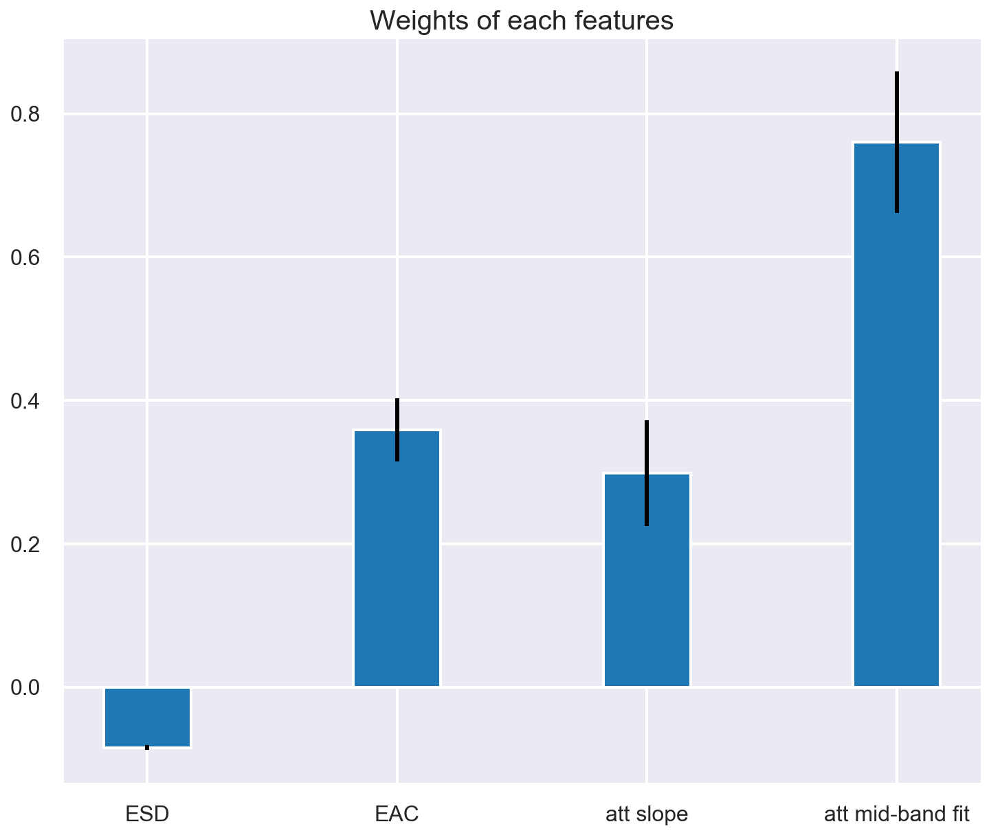

In [69]:
plt.figure(figsize = (12, 10))
width = 0.35       # the width of the bars: can also be len(x) sequence
p1 = plt.bar(np.arange(4) , mean_weights, width, yerr = std_weights)
plt.title('Weights of each features')
sup_t = plt.xticks(np.arange(4), ('ESD', 'EAC', 'att slope', 'att mid-band fit'))

In [48]:
X_train.shape

(1580, 4)

In [49]:
X_test.shape

(260, 4)

In [51]:
l1 = np.where(y_train == 0)[0]
l2 = np.where(y_train == 1)[0]
l3 = np.where(y_test == 0) [0]
l4 = np.where(y_test == 1) [0]

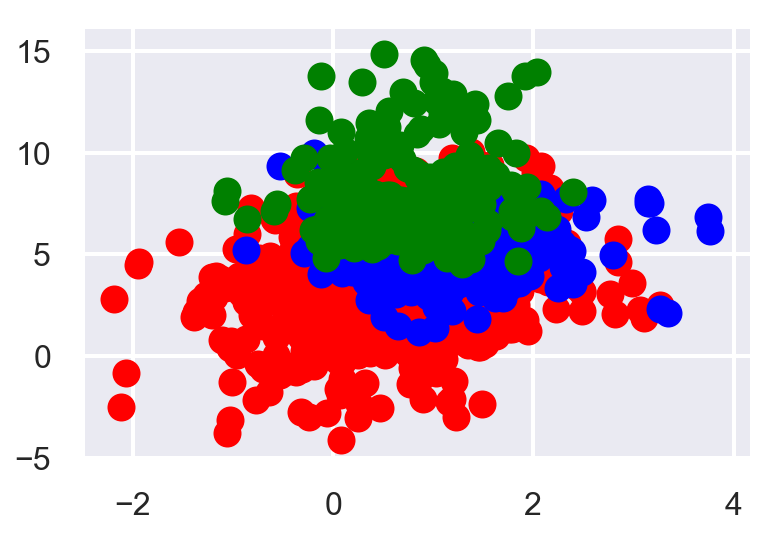

In [52]:
plt.scatter(X_train[l1,2], X_train[l1,3], c = 'r')
plt.scatter(X_train[l2,2], X_train[l2,3], c = 'b')
plt.scatter(X_test[:,2], X_test[:, 3], c= 'g')

Threshold lipid 9.000000


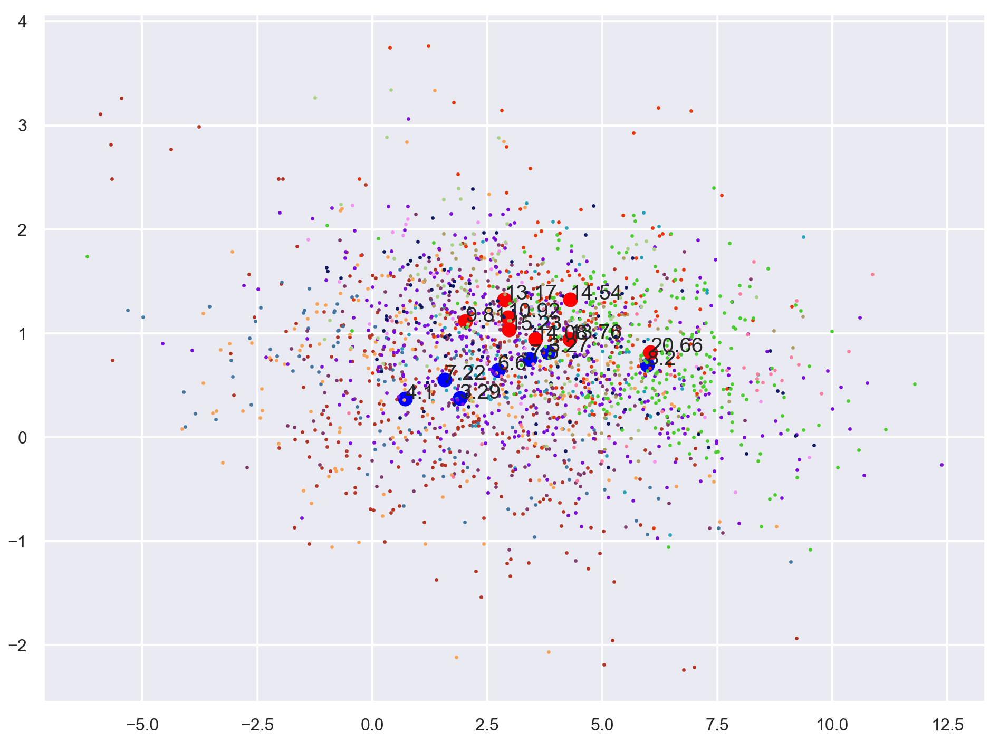

In [36]:
#f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (16, 12))
plt.figure(figsize = (16, 12))
mean_att_red  = []
mean_att_blue = []
slope_intercept_att = np.zeros((15, 2))
print("Threshold lipid %f" % threshold_lipid )
for idx, row in dataBase.iterrows():
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    color = np.random.rand(3,)
    #if row['bad Rabbit']:
    #    continue
    atts = ATTs_dict[rabbit_number]
    if (len(atts) == 0):
        continue 
        print(rabbit_number)
    freq_key = next(iter(freq_att_dict[rabbit_number]))
    freq = freq_att_dict[rabbit_number][freq_key].flatten()
    idx = (freq >=4.0) & (freq <=5.0)
    rabbit_att = []
    temp1 = []
    temp2 = []
    for frame_ in atts:
        if (atts[frame_].shape[1] > 0):
            bottom_depth = att_bottom[rabbit_number][frame_].flatten()
            filter_att = []
            for idx in range(bottom_depth.shape[0]): # goes through all the ROIs
                if ((bottom_depth[idx] < 37) and (bottom_depth[idx] >5)):
                    single_att = atts[frame_][:,idx]
                    filter_att.append(single_att)
                    slope, intercept = np.polyfit(freq, single_att, 1)
                    temp1.append(slope)
                    temp2.append(single_att[idx].mean())
                    plt.scatter(single_att[idx].mean(), slope, c = color, s = 2)
            if not filter_att:
                continue
            avg_att = np.mean(np.vstack(filter_att), axis = 0)
            rabbit_att.append(avg_att) #mean att in each frame
    if lipid >=9:
        plt.scatter(np.mean(np.array(temp2)), np.mean(np.array(temp1)), c = 'r')
        plt.text(np.mean(np.array(temp2)), np.mean(np.array(temp1)), str(lipid))
    else:
        plt.scatter(np.mean(np.array(temp2)), np.mean(np.array(temp1)), c = 'b')
        plt.text(np.mean(np.array(temp2)), np.mean(np.array(temp1)), str(lipid))
    #break

In [21]:
single_att.shape

(1024,)

In [ ]:

    if not rabbit_att:
        print(rabbit_number)
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'bad Rabbit'] = True
        continue
    rabbit_att  = np.mean(np.vstack(rabbit_att), axis = 0) #mean att for each rabbit
    idx = (freq >=4.0) & (freq <=5.0)
    if (lipid > threshold_lipid):
        ax1.plot(freq, rabbit_att, color = 'red') 
        ax3.plot(freq, rabbit_att, color = 'red') 
        
        slope, intercept = np.polyfit(freq, rabbit_att, 1)
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'att slope'] = slope
        dataBase.loc[dataBase.Rabbit == row.Rabbit,'att intercept'] = intercept
        dataBase.loc[dataBase.Rabbit == row.Rabbit, 'midband fit'] = rabbit_att[idx].mean()
        mean_att_red.append(rabbit_att)
        ax1.text(freq[-1] + 0.1, rabbit_att[-1], str(lipid), fontsize = 12)
    else:

        ax2.plot(freq, rabbit_att, color = 'blue')
        ax3.plot(freq, rabbit_att, color = 'blue') 
        slope, intercept = np.polyfit(freq, rabbit_att, 1)
            mean_att_blue.append(rabbit_att)
        slope, intercept = np.polyfit(freq, rabbit_att, 1)
        ax2.text(freq[-1] , rabbit_att[-1], str(lipid), fontsize = 12)

